# Load libraries

In [401]:
import sys
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import scipy.io as io
from scipy.sparse import csr_matrix
import logging
import os
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
import math
import random
import warnings
warnings.simplefilter('ignore')
logging.basicConfig(level=logging.INFO)
savepath = 'Lupus_study_adjusted_V6.h5ad'

# Read data

In [2]:
%matplotlib inline
sc.settings.verbosity = 2
sc.settings.autoshow = False
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
adata = sc.read(savepath, cache=True)
figdir = "./Lupus Revision Figure 1"
sc.settings.figdir = figdir

MASTERCOLORS = sc.pl.palettes.default_64
MASTERCOLORS.remove("#FEFFE6")
MASTERCOLORS.remove("#FFFF00")

colorrs = ["#4E79A7","#A0CBE8","#F28E2B","#FFBE7D","#8CD17D","#B6992D","#499894","#E15759","#FF9D9A","#79706E",
           "#D37295","#FABFD2", '#B07AA1',"#B07AA1","#D4A6C8","#9D7660","#E58606", "#5D69B1", "#24796C",
           '#DAA51B', '#000000', '#99C945', '#ED645A']
# Remove protein labels
for key in adata.obs_keys(): 
    if key.split('|')[-1]=='pAbO':
        del adata.obs[key] 
print('Processed dataset: {}'.format(adata))

Processed dataset: AnnData object with n_obs × n_vars = 1299071 × 1000 
    obs: 'Broad', 'Female', 'Prob(doublet)', 'SOURCE', 'batch', 'batch_cov', 'ct_cov', 'disease_cov', 'ind_cov', 'pop_cov', 'well', 'SLE_status', 'percent_mito', 'n_counts', 'n_genes', 'PF4', 'PC2', 'PC3', 'leiden', 'Cohort', 'ind_cov_cohort_disease_cov', 'ind_cov_disease_cov', 'disease_cohort_cov'
    var: 'gene_ids-1', 'feature_types-1', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'diffmap_evals', 'leiden', 'neighbors', 'pca', 'rank_genes_groups', 'total_pbmcs'
    obsm: 'X_diffmap', 'X_pca', 'X_umap'
    varm: 'PCs'


# Projections

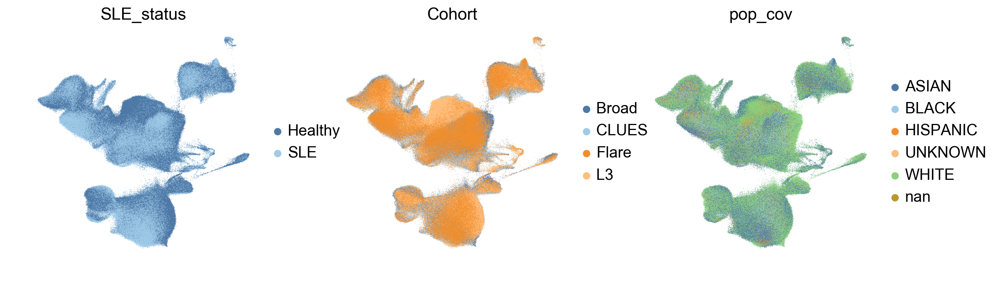

In [4]:
disease_umap = sc.pl.umap(adata, color=['SLE_status', 'Cohort', 'pop_cov'], size=0.8, show=True, edgecolor="none", palette=colorrs, save='.disease.png')


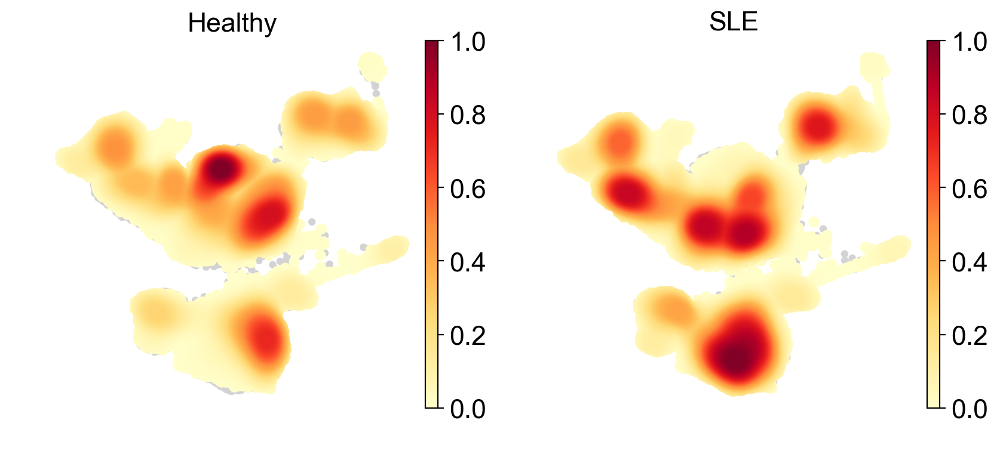

In [96]:
#sc.tl.embedding_density(adata, basis='umap', groupby='SLE_status')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_SLE_status', show=True,  save='umap_density_SLE_status.pdf')



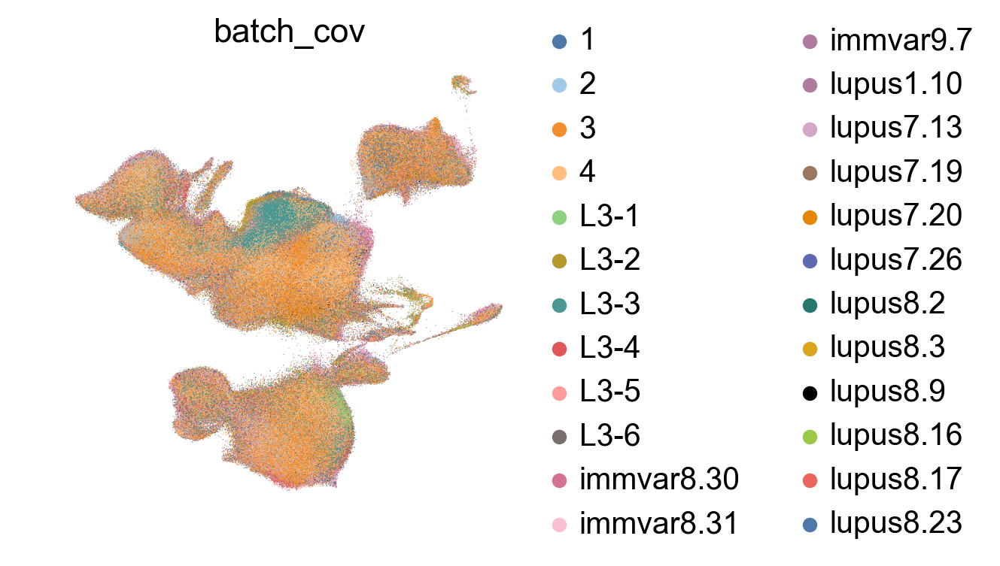

In [5]:
disease_umap = sc.pl.umap(adata, color='batch_cov', size=.8,show=True, edgecolor="none", palette=colorrs, save='.batch.png')

# Rank genes and plot leiden groups

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


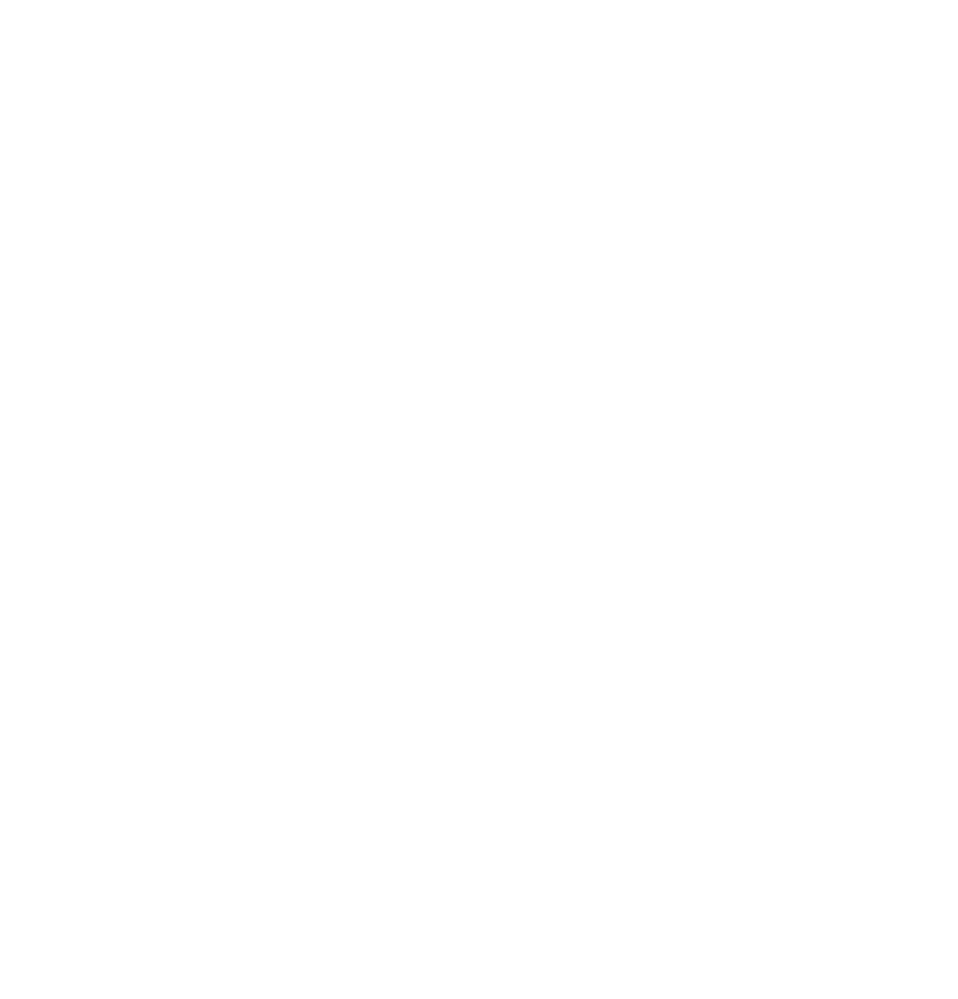

In [114]:
warnings.simplefilter('ignore')
# Plot 16 plots for the individuals.
fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7),sharex=True, sharey=True)
fig.tight_layout()
plt.subplots_adjust(wspace=-0.1, hspace=0)

batch_name = adata.obs.batch_cov.unique()[0]
batch = adata.obs.ind_cov_disease_cov[adata.obs.batch_cov==batch_name].unique();
batch = np.sort(batch.categories.values)
for ind_i in list(range(16)):
    ind = batch[ind_i]
    col = colorrs[ind_i]
    sc.pl.umap(adata[adata.obs.ind_cov==ind,], color = "ct_cov", title=None, ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=10, edgecolor="none")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")

fig.savefig(figdir+'/'+'individual_umaps.pdf')

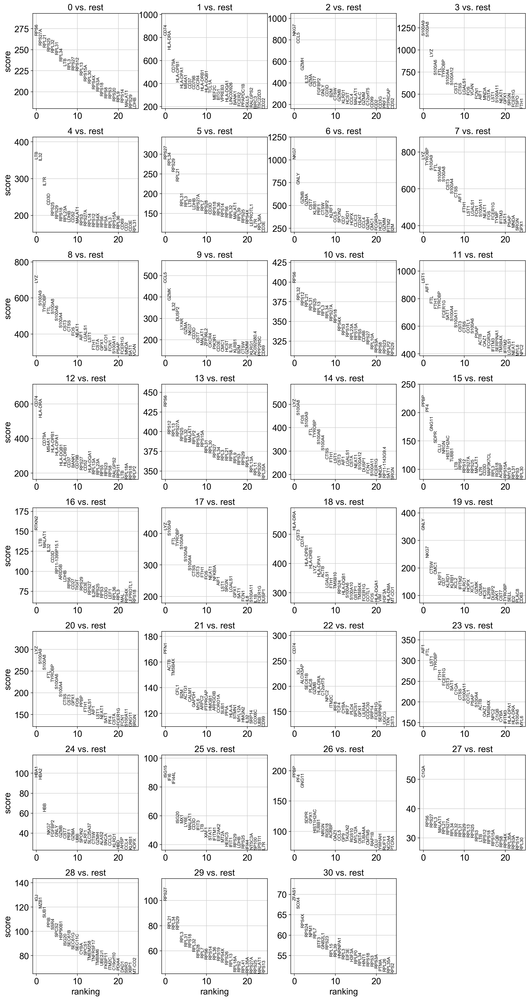

In [7]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

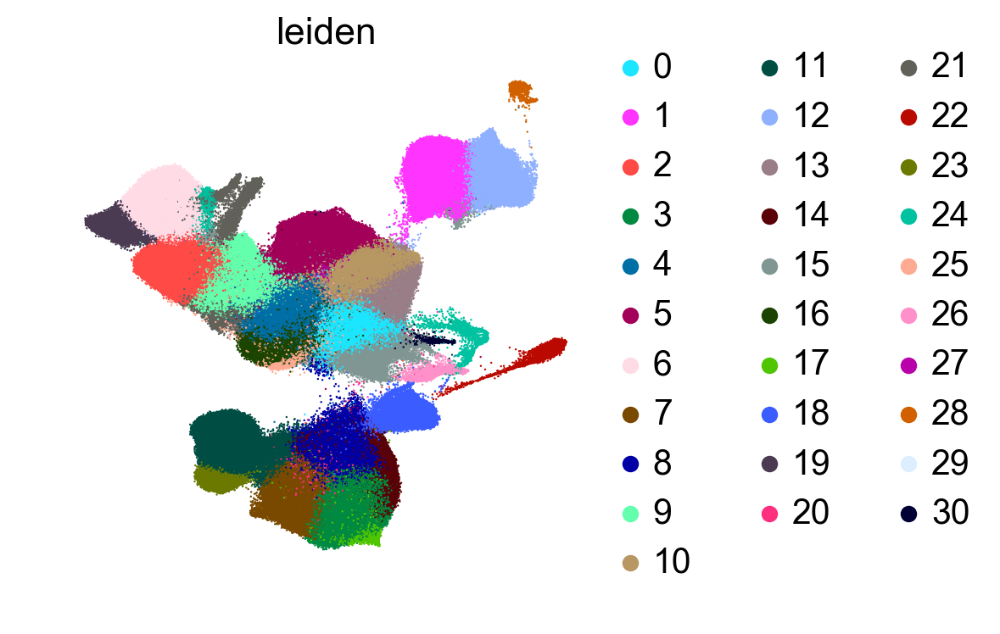

In [8]:
sc.pl.umap(adata, color='leiden', size=3, show=True, edgecolor="none", save='.leiden.png', palette=MASTERCOLORS)

# Most expressed genes per leiden group

In [9]:
pd.set_option('display.max_columns', None)
unique_leiden = np.unique(adata.obs['leiden'].values)
# Compile list of top genes
GeneRanks = pd.DataFrame()
for ii in range(len(unique_leiden)):
    GeneRanks[str('leiden_' + str(ii))] = adata.var_names[np.flipud(np.argsort(np.mean(adata.X[adata.obs['leiden'] == str(ii)], axis=0)))]
GeneRanks.to_csv('Lupus_study_top_expression.csv')
GeneRanks.head(15)

,leiden_0,leiden_1,leiden_2,leiden_3,leiden_4,leiden_5,leiden_6,leiden_7,leiden_8,leiden_9,leiden_10,leiden_11,leiden_12,leiden_13,leiden_14,leiden_15,leiden_16,leiden_17,leiden_18,leiden_19,leiden_20,leiden_21,leiden_22,leiden_23,leiden_24,leiden_25,leiden_26,leiden_27,leiden_28,leiden_29,leiden_30
0,RPL21,TCL1A,GZMH,S100A12,LTB,RPS4Y1,GZMB,IFITM3,LYZ,GZMK,RP11-291B21.2,FCGR3A,RP5-887A10.1,RPL21,DDX3Y,PPBP,RTKN2,IL1B,FCER1A,XCL1,PPBP,KIAA0101,LILRA4,C1QB,HBA2,IFIT3,CLEC1B,C1QA,MZB1,CD8B,PRSS57
1,RPS6,CD79A,CCL5,S100A8,TNFRSF4,EIF1AY,KLRF1,LGALS2,S100A9,DUSP2,CD8B,CDKN1C,MS4A1,RPS6,LYZ,PF4,RP11-1399P15.1,IL8,CLEC10A,XCL2,LYZ,STMN1,SERPINF1,C1QA,HBA1,IFI44L,ESAM,C1QB,IGJ,RPL21,SPINK2
2,RPL34,RPL34,NKG7,S100A9,IL7R,DDX3Y,PRF1,LYZ,CST3,CCL5,S100B,MS4A7,CD79A,RPS29,EIF1AY,GNG11,IL2RA,CCL3,CD1C,KLRC1,S100A9,TYMS,PLD4,C1QC,HBB,ISG15,MPP1,RPS6,TNFRSF17,RPS6,SOX4
3,FHIT,RPL21,IL32,VCAN,IL32,RPS6,GNLY,FCN1,S100A8,LYAR,CD8A,HES4,BANK1,MALAT1,S100A9,CLU,TIGIT,G0S2,HLA-DQA1,GNLY,S100A8,MKI67,ITM2C,FCGR3A,SNCA,IFIT1,ILK,RPL21,DERL3,RP11-291B21.2,RP11-354E11.2
4,RPS12,FCER2,CST7,LYZ,RP11-403A21.2,RPL21,SPON2,CST3,LGALS2,IL32,RPS6,LST1,AL928768.3,RPL34,FOS,SDPR,ARID5B,EREG,HLA-DPB1,CMC1,TYROBP,RRM2,TPM2,MS4A7,HBD,MX1,RAB32,RPS12,ITM2C,RPL34,EGFL7
5,RPS29,CD79B,FGFBP2,MNDA,GATA3,RPL34,NKG7,MNDA,TYROBP,GZMA,RPS12,RP11-290F20.3,AC079767.4,RPS12,RPS4Y1,MALAT1,ICA1,CXCL2,HLA-DQB1,KLRF1,CTSS,NUSAP1,SCT,LST1,FGFBP2,IFI6,FCER1G,RPS29,IGLL5,AC013264.2,ANKRD28
6,LTB,VPREB3,GZMA,FCN1,KLRB1,RPS29,FGFBP2,S100A9,FTL,PIK3R1,RPL21,AIF1,RPL41,FHIT,S100A8,MYL9,BIRC3,NFKBIA,HLA-DPA1,CTSW,S100A6,CENPF,LRRC26,HES4,SPON2,HERC5,NFE2,RPL34,HRASLS2,RPS12,TFPI
7,CCR7,MS4A1,CD8A,RBP7,ARID5B,RPS12,CLIC3,CTSS,CTSS,CMC1,RPS29,IFITM3,RALGPS2,LTB,TYROBP,RPS29,LTB,IER3,HLA-DRB1,IL2RB,VCAN,TOP2A,PPP1R14B,AIF1,PRF1,XAF1,GMPR,MALAT1,AL928768.3,HRASLS2,STMN1
8,MALAT1,LINC00926,GNLY,TYROBP,RORA,LTB,CST7,MS4A6A,GPX1,KLRG1,CCR7,SERPINA1,RPL34,CCR7,CTSS,RPS6,RGS1,CCL3L1,CPVL,SPTSSB,MNDA,PTTG1,IGJ,IFITM3,GZMB,STAT1,FERMT3,LTB,CD38,RPS29,PBX1
9,TSHZ2,LTB,KLRG1,CD14,RPL41,RPL41,GZMA,IFI6,NEAT1,CST7,RPL34,SAT1,COBLL1,RPL41,FTL,RPL41,IL32,LYZ,HLA-DRA,KLRD1,FCN1,UBE2C,UGCG,RP11-290F20.3,CST7,NT5C3A,TPM4,RPL41,FKBP11,NUCB2,KIAA0125


# Label cell populations

In [10]:
adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('object')
adata.obs['ct_cov'].loc[adata.obs.leiden == "0"] = "Naive T" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "1"] = "B" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "2"] = "Cytotoxic T" ## good                                                                                     
adata.obs['ct_cov'].loc[adata.obs.leiden == "3"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "4"] = "EM T" ## good   
adata.obs['ct_cov'].loc[adata.obs.leiden == "5"] = "Naive T" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "6"] = "NK" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "7"] = "cM" ## good        
adata.obs['ct_cov'].loc[adata.obs.leiden == "8"] = "cM" ## good     
adata.obs['ct_cov'].loc[adata.obs.leiden == "9"] = "Cytotoxic T" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "10"] = "Naive T" ## good    
adata.obs['ct_cov'].loc[adata.obs.leiden == "11"] = "ncM" ## Check
adata.obs['ct_cov'].loc[adata.obs.leiden == "12"] = "B" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "13"] = "Naive T" ## good 
adata.obs['ct_cov'].loc[adata.obs.leiden == "14"] = "cM" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "15"] = "MK" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "16"] = "T-Reg" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "17"] = "cM" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "18"] = "cDC" ## good  
adata.obs['ct_cov'].loc[adata.obs.leiden == "19"] = "NK" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "20"] = "Doublets" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "21"] = "Proliferating T" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "22"] = "pDC" ## good Progenitor T
adata.obs['ct_cov'].loc[adata.obs.leiden == "23"] = "ncM" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "24"] = "RBCs" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "25"] = "EM T" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "26"] = "MK" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "27"] = "Naive T" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "28"] = "B" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "29"] = "Naive T" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "30"] = "Progenitor T" ## good
adata.obs['ct_cov'] = adata.obs.ct_cov.astype('category')

In [ ]:
# Flare cohort unique pseudobulk signature?
# Split pseudobulk into asian and caucasian and see if either drives effect?
# Fix protein scaling
# Start Broader view/unbiased view of gene. Gene enrichment analysis.
# Covariance-MinCheol method
# lymphocyte figure
# EHR WBC compared total PBMCs/volume Correlate

# Plot cell types

In [118]:
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='pdf', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
MasterORDER = ['cM', 'ncM', 'cDC', 'pDC','Naive T', 'EM T', 'T-Reg', 'Cytotoxic T', 'Proliferating T',
               'NK', 'B', 'Progenitor T', 'MK', 'RBCs', 'Doublets']

colorrs = ["#4E79A7","#A0CBE8","#F28E2B","#FFBE7D","#8CD17D","#B6992D","#499894","#E15759","#FF9D9A","#79706E",
           "#D37295","#FABFD2", '#B07AA1',"#B07AA1","#D4A6C8","#9D7660","#E58606", "#5D69B1", "#24796C",
           '#DAA51B', '#000000', '#99C945', '#ED645A']

adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_colors'] = colorrs
celltype_umap = sc.pl.umap(adata, color='ct_cov', show=True, size=3, edgecolor="none", save='_celltypes.pdf')

ValueError: items in new_categories are not the same as in old categories

# Plot individual variability

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


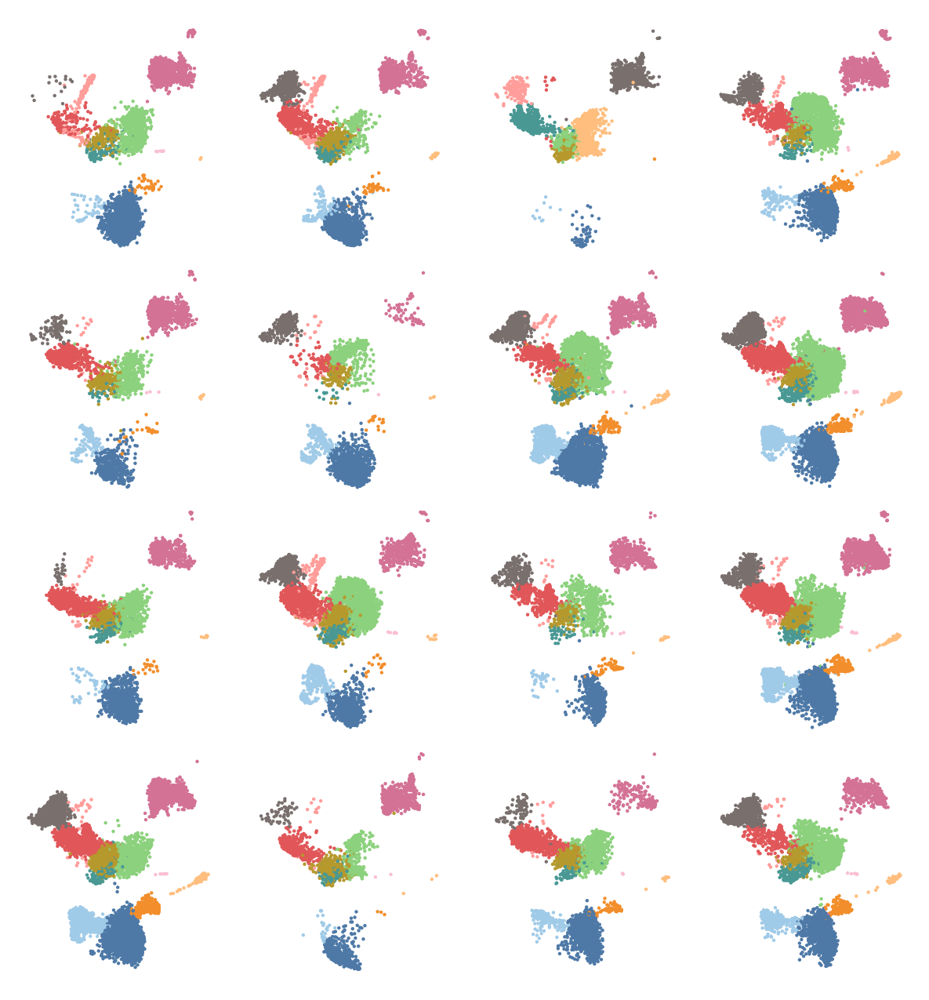

In [121]:
fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7), sharex=True, sharey=True)
fig.tight_layout()
plt.subplots_adjust(wspace=-0.1, hspace=0)

batch_name = adata.obs.batch_cov.unique()[0]
batch = adata.obs.ind_cov[adata.obs.batch_cov==batch_name].unique();
batch = np.sort(batch.categories.values)
for ind_i in list(range(16)):
    ind = batch[ind_i]
    col = colorrs[ind_i]
    sc.pl.umap(adata[adata.obs.ind_cov==ind,], color = "ct_cov", title=None, ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=10, edgecolor="none", palette=colorrs)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")
    
fig.savefig(figdir+'/'+'individual_umaps.pdf')    

# Remove RBCs, Doublets, and MKs from further analysis

In [12]:
adata = adata[~adata.obs['ct_cov'].isin(['RBCs', 'Doublets', 'MK'])]

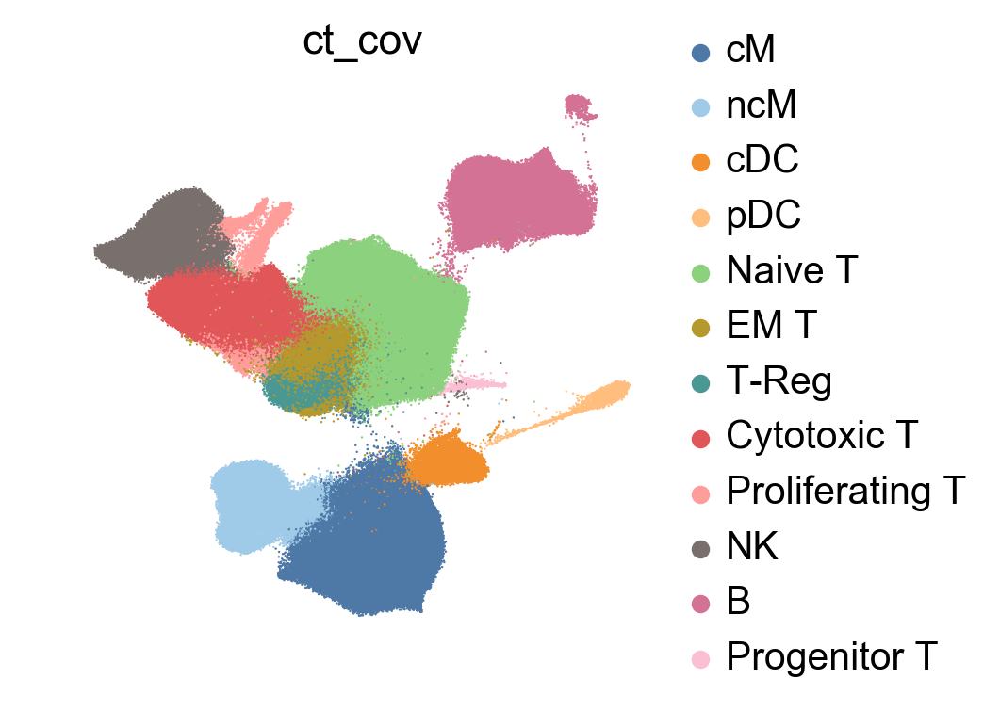

In [119]:
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='pdf', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
MasterORDER = ['cM', 'ncM', 'cDC', 'pDC','Naive T', 'EM T', 'T-Reg', 'Cytotoxic T', 'Proliferating T',
               'NK', 'B', 'Progenitor T']
adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_colors'] = colorrs
celltype_umap = sc.pl.umap(adata, color='ct_cov', show=True, size=3, edgecolor="none", save='_celltypes_clean.pdf')

# Generate some groups

In [91]:
adata.obs['pop_cov'][adata.obs['ind_cov']=='1941_1941'] = 'WHITE'
adata.obs['pop_cov'][adata.obs['ind_cov']=='HC-020'] = 'ASIAN'

adata.obs['ind_cov_pop_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['ind_cov']+ row['pop_cov'], axis=1), ordered=True)
adata.obs['pop_cov_SLE_status'] = pd.Categorical(adata.obs.apply(lambda row: row['pop_cov']+row['SLE_status'], axis=1), ordered=True)
adata.obs['ind_cov_pop_cov_cohort'] = pd.Categorical(adata.obs.apply(lambda row: row['ind_cov']+row['pop_cov']+row['Cohort'], axis=1), ordered=True)
adata.obs['pop_cov_cohort_SLE_status'] = pd.Categorical(adata.obs.apply(lambda row: row['pop_cov']+row['Cohort']+row['SLE_status'], axis=1), ordered=True)


# Proportions and Statistics

['Healthy'] versus ['SLE']


,Beta,Cell,Pval
0,10.457312778369381,cM,0.000000
1,2.030427951247187,ncM,0.000000
2,-0.25672326858644956,cDC,0.005702
3,-0.39540719383835904,pDC,0.000000
4,-19.90559342399445,Naive T,0.000000
5,4.428507785307322,EM T,0.000000
6,0.8322065128239451,T-Reg,0.000000
7,3.6402598210249506,Cytotoxic T,0.000390
8,0.3686446073054814,Proliferating T,0.000000
9,-0.7653576031365105,NK,0.148971


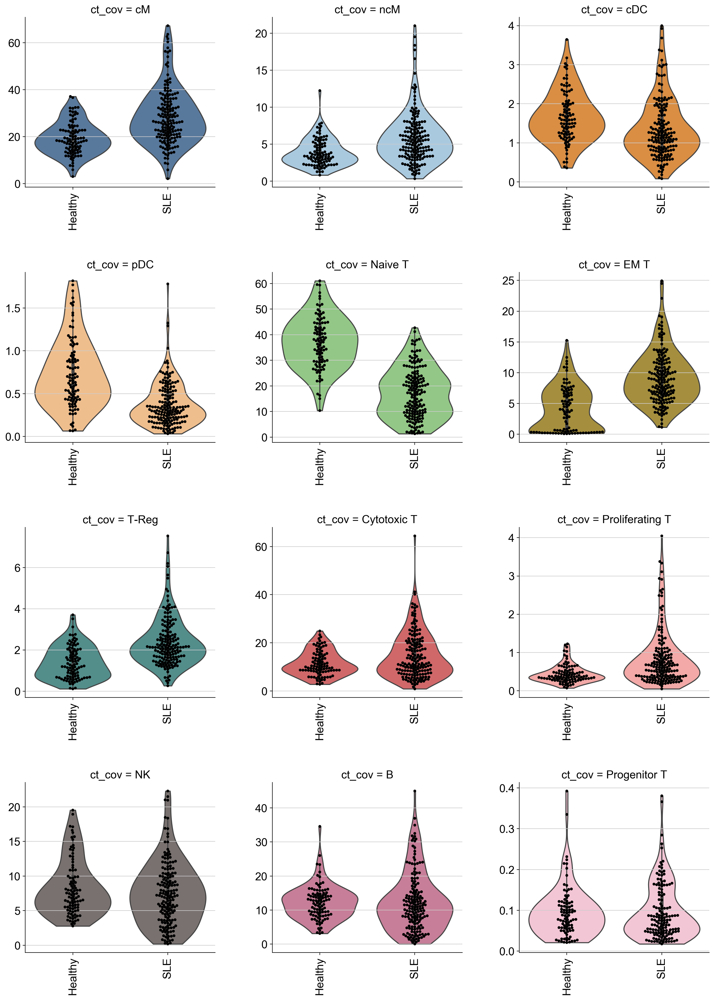

In [97]:
## Make proportion plots
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov','ct_cov','SLE_status'], observed=True)['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov==ind_count_sums.ind_cov[ii]] = ind_count_sums.counts[ii]


ind_perc.ind_cov = ind_perc.ind_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov = ind_count_sums.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc.ind_cov = ind_perc.ind_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

perc_plot = sns.catplot(x='SLE_status', y='ct_perc', order=["Healthy", "SLE"], hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, col='ct_cov', col_wrap=3, cut=0, dodge=False, aspect=1, sharex=False, sharey=False, palette=colorrs)

for ct_i in range(len(MasterORDER)):
    ct = MasterORDER[ct_i]
    sns.swarmplot(x="SLE_status", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], order=["Healthy", "SLE"], color="0", size=4, ax=perc_plot.axes[ct_i])
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.3, hspace = 0.5)
    
perc_plot.savefig(figdir+"/violin.ct_cov_proportions.pdf")

def get_proportion_stats(ind_perc, group1, group2, covar):
    print('{0} versus {1}'.format(group1, group2))
    all_out = pd.DataFrame();
    ind_perc0 = ind_perc[ind_perc[covar].isin(group1+group2)]
    Effect = {}
    for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
        ct = ind_perc0.ct_cov.cat.categories[ct_i]
        ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
        weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
        disease = ind_perc0[covar][ind_perc0.ct_cov==ct]
        disease = disease.astype("str")
        disease.values[disease.isin(group1)] = 0
        disease.values[disease.isin(group2)] = 1
        disease = sm.add_constant(disease)
        est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
        est=est.fit()
        effect=est.params[1]
        pval=est.pvalues[1]
        Effect[ct] = effect
        all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
        all_out['Pval'] = all_out['Pval'].astype(float)
    def highlight_max(p):
        sig = p < (0.01/len(p))
        return ['background-color: yellow' if v else '' for v in sig]
    all_out = all_out.style.apply(highlight_max, subset=['Pval'])   
    display(all_out)
    return all_out
Stats = get_proportion_stats(ind_perc, group1=['Healthy'], group2=['SLE'], covar='SLE_status')

# Proportion and statistics by race (all)

['WHITEHealthy'] versus ['ASIANHealthy']


,Beta,Cell,Pval
0,2.6750343057608603,cM,0.120884
1,-0.274335581593123,ncM,0.568615
2,-0.009312000515641128,cDC,0.955507
3,-0.2825582433618894,pDC,0.007288
4,3.623082320159762,Naive T,0.185060
5,-3.350015070543301,EM T,0.000930
6,-0.7369711502787315,T-Reg,0.000798
7,0.828224408900509,Cytotoxic T,0.559544
8,0.02454076875199384,Proliferating T,0.688191
9,-1.5954839680278576,NK,0.126106


['WHITEHealthy'] versus ['WHITESLE']


,Beta,Cell,Pval
0,11.073266994530332,cM,0.000000
1,2.195873644985283,ncM,0.000001
2,-0.17830050972856049,cDC,0.104597
3,-0.3861770164496865,pDC,0.000000
4,-17.89661934200778,Naive T,0.000000
5,4.790278450643058,EM T,0.000000
6,0.7469508205739901,T-Reg,0.000027
7,2.330705578637764,Cytotoxic T,0.050829
8,0.26190599389918284,Proliferating T,0.001220
9,-0.3561522172437087,NK,0.608289


['ASIANHealthy'] versus ['ASIANSLE']


,Beta,Cell,Pval
0,8.51668134122728,cM,0.004149
1,2.2232581987565094,ncM,0.020032
2,-0.2732413036077697,cDC,0.201693
3,-0.19014206271567197,pDC,0.001189
4,-24.076714533862624,Naive T,0.000000
5,6.610038976409792,EM T,0.000000
6,1.4143723037209588,T-Reg,0.000005
7,3.4866482440102198,Cytotoxic T,0.132663
8,0.38350262446390654,Proliferating T,0.019347
9,-0.20344764601507914,NK,0.839966


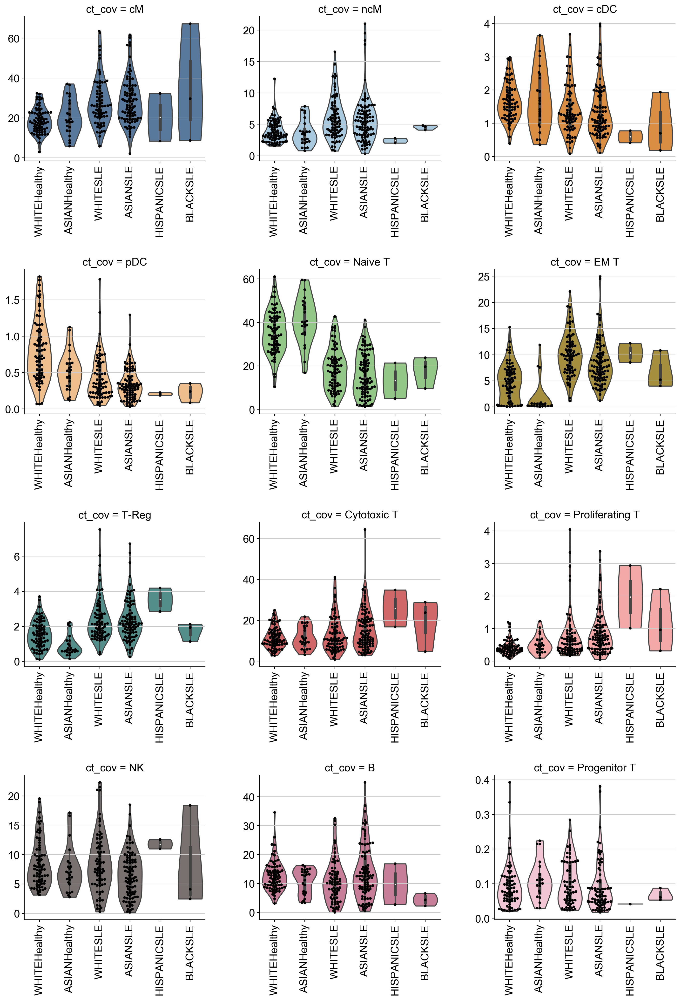

In [99]:
## Make proportion plots
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_pop_cov','ct_cov','pop_cov_SLE_status','SLE_status', 'ind_cov'], observed=True)['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_pop_cov==ind_count_sums.ind_cov_pop_cov[ii]] = ind_count_sums.counts[ii]


ind_perc.ind_cov_pop_cov = ind_perc.ind_cov_pop_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_pop_cov = ind_count_sums.ind_cov_pop_cov.apply(lambda x: x.split('_')[0])
ind_perc.ind_cov_pop_cov = ind_perc.ind_cov_pop_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

perc_plot = sns.catplot(x='pop_cov_SLE_status', y='ct_perc', order=['WHITEHealthy', 'ASIANHealthy', 'WHITESLE', 'ASIANSLE', 'HISPANICSLE', 'BLACKSLE'], hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, col='ct_cov', col_wrap=3, cut=0, dodge=False, aspect=1, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.swarmplot(x="pop_cov_SLE_status", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], order=['WHITEHealthy', 'ASIANHealthy', 'WHITESLE', 'ASIANSLE', 'HISPANICSLE', 'BLACKSLE'], color="0", size=4, ax=perc_plot.axes[ct_i])
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.3, hspace = 0.75)
    
perc_plot.savefig(figdir+"/violin.ct_cov_proportions_race_all.pdf")

def get_proportion_stats(ind_perc, group1, group2, covar):
    print('{0} versus {1}'.format(group1, group2))
    all_out = pd.DataFrame();
    ind_perc0 = ind_perc[ind_perc[covar].isin(group1+group2)]
    Effect = {}
    for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
        ct = ind_perc0.ct_cov.cat.categories[ct_i]
        ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
        weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
        disease = ind_perc0[covar][ind_perc0.ct_cov==ct]
        disease = disease.astype("str")
        disease.values[disease.isin(group1)] = 0
        disease.values[disease.isin(group2)] = 1
        disease = sm.add_constant(disease)
        est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
        est=est.fit()
        effect=est.params[1]
        pval=est.pvalues[1]
        Effect[ct] = effect
        all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
        all_out['Pval'] = all_out['Pval'].astype(float)
    def highlight_max(p):
        sig = p < (0.01/len(p))
        return ['background-color: yellow' if v else '' for v in sig]
    all_out = all_out.style.apply(highlight_max, subset=['Pval'])   
    display(all_out)

get_proportion_stats(ind_perc, group1=['WHITEHealthy'], group2=['ASIANHealthy'], covar='pop_cov_SLE_status')
get_proportion_stats(ind_perc, group1=['WHITEHealthy'], group2=['WHITESLE'], covar='pop_cov_SLE_status')
get_proportion_stats(ind_perc, group1=['ASIANHealthy'], group2=['ASIANSLE'], covar='pop_cov_SLE_status')


# Proportion and statistics by race European and Asian only

['WHITEHealthy'] versus ['ASIANHealthy']


,Beta,Cell,Pval
0,2.6750343057608603,cM,0.120884
1,-0.274335581593123,ncM,0.568615
2,-0.009312000515641128,cDC,0.955507
3,-0.2825582433618894,pDC,0.007288
4,3.623082320159762,Naive T,0.185060
5,-3.350015070543301,EM T,0.000930
6,-0.7369711502787315,T-Reg,0.000798
7,0.828224408900509,Cytotoxic T,0.559544
8,0.02454076875199384,Proliferating T,0.688191
9,-1.5954839680278576,NK,0.126106


['WHITEHealthy'] versus ['WHITESLE']


,Beta,Cell,Pval
0,11.073266994530332,cM,0.000000
1,2.195873644985283,ncM,0.000001
2,-0.17830050972856049,cDC,0.104597
3,-0.3861770164496865,pDC,0.000000
4,-17.89661934200778,Naive T,0.000000
5,4.790278450643058,EM T,0.000000
6,0.7469508205739901,T-Reg,0.000027
7,2.330705578637764,Cytotoxic T,0.050829
8,0.26190599389918284,Proliferating T,0.001220
9,-0.3561522172437087,NK,0.608289


['ASIANHealthy'] versus ['ASIANSLE']


,Beta,Cell,Pval
0,8.51668134122728,cM,0.004149
1,2.2232581987565094,ncM,0.020032
2,-0.2732413036077697,cDC,0.201693
3,-0.19014206271567197,pDC,0.001189
4,-24.076714533862624,Naive T,0.000000
5,6.610038976409792,EM T,0.000000
6,1.4143723037209588,T-Reg,0.000005
7,3.4866482440102198,Cytotoxic T,0.132663
8,0.38350262446390654,Proliferating T,0.019347
9,-0.20344764601507914,NK,0.839966


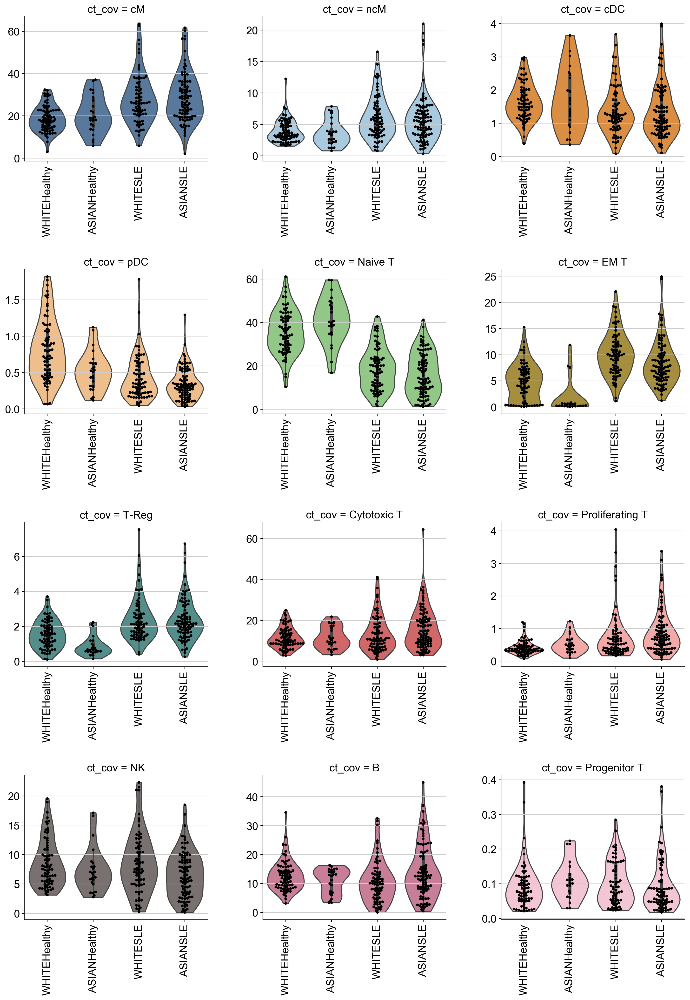

In [100]:
## Make proportion plots
adatatmp = adata[~adata.obs['pop_cov_SLE_status'].isin(['HISPANICSLE', 'BLACKSLE'])]
adata_obs_small = adatatmp.obs
ind_count = adata_obs_small.groupby(['ind_cov_pop_cov','ct_cov','pop_cov_SLE_status','SLE_status', 'ind_cov'], observed=True)['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_pop_cov==ind_count_sums.ind_cov_pop_cov[ii]] = ind_count_sums.counts[ii]


ind_perc.ind_cov_pop_cov = ind_perc.ind_cov_pop_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_pop_cov = ind_count_sums.ind_cov_pop_cov.apply(lambda x: x.split('_')[0])
ind_perc.ind_cov_pop_cov = ind_perc.ind_cov_pop_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

perc_plot = sns.catplot(x='pop_cov_SLE_status', y='ct_perc', order=['WHITEHealthy', 'ASIANHealthy', 'WHITESLE', 'ASIANSLE'], hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, col='ct_cov', col_wrap=3, cut=0, dodge=False, aspect=1, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.swarmplot(x="pop_cov_SLE_status", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], order=['WHITEHealthy', 'ASIANHealthy', 'WHITESLE', 'ASIANSLE'], color="0", size=4, ax=perc_plot.axes[ct_i])
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.3, hspace = 0.75)
    
perc_plot.savefig(figdir+"/violin.ct_cov_proportions_race_EurAsian.pdf")

def get_proportion_stats(ind_perc, group1, group2, covar):
    print('{0} versus {1}'.format(group1, group2))
    all_out = pd.DataFrame();
    ind_perc0 = ind_perc[ind_perc[covar].isin(group1+group2)]
    Effect = {}
    for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
        ct = ind_perc0.ct_cov.cat.categories[ct_i]
        ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
        weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
        disease = ind_perc0[covar][ind_perc0.ct_cov==ct]
        disease = disease.astype("str")
        disease.values[disease.isin(group1)] = 0
        disease.values[disease.isin(group2)] = 1
        disease = sm.add_constant(disease)
        est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
        est=est.fit()
        effect=est.params[1]
        pval=est.pvalues[1]
        Effect[ct] = effect
        all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
        all_out['Pval'] = all_out['Pval'].astype(float)
    def highlight_max(p):
        sig = p < (0.01/len(p))
        return ['background-color: yellow' if v else '' for v in sig]
    all_out = all_out.style.apply(highlight_max, subset=['Pval'])   
    display(all_out)

get_proportion_stats(ind_perc, group1=['WHITEHealthy'], group2=['ASIANHealthy'], covar='pop_cov_SLE_status')
get_proportion_stats(ind_perc, group1=['WHITEHealthy'], group2=['WHITESLE'], covar='pop_cov_SLE_status')
get_proportion_stats(ind_perc, group1=['ASIANHealthy'], group2=['ASIANSLE'], covar='pop_cov_SLE_status')


# Proportion and statistics by race European and Asian only (CLUES, Flare, L3 only)

['WHITEHealthy'] versus ['ASIANHealthy']


,Beta,Cell,Pval
0,3.0124384547460448,cM,0.100890
1,-0.14250619269761167,ncM,0.784581
2,0.059744707082275805,cDC,0.731627
3,-0.1949960931444952,pDC,0.049283
4,0.8366704536174607,Naive T,0.765293
5,-2.5911601723712945,EM T,0.023829
6,-0.6148486605305643,T-Reg,0.014516
7,1.5353449456305335,Cytotoxic T,0.296778
8,0.0625919111530004,Proliferating T,0.224720
9,-1.785427759745261,NK,0.095770


['WHITEHealthy'] versus ['WHITESLE']


,Beta,Cell,Pval
0,11.410671143515517,cM,0.000000
1,2.327703033880794,ncM,0.000020
2,-0.10924380213064322,cDC,0.394036
3,-0.2986148662322925,pDC,0.000006
4,-20.68303120855009,Naive T,0.000000
5,5.549133348815065,EM T,0.000000
6,0.8690733103221571,T-Reg,0.000089
7,3.037826115367786,Cytotoxic T,0.035868
8,0.2999571363001894,Proliferating T,0.002652
9,-0.5460960089611151,NK,0.499947


['ASIANHealthy'] versus ['ASIANSLE']


,Beta,Cell,Pval
0,8.51668134122728,cM,0.004149
1,2.2232581987565094,ncM,0.020032
2,-0.2732413036077697,cDC,0.201693
3,-0.19014206271567197,pDC,0.001189
4,-24.076714533862624,Naive T,0.000000
5,6.610038976409792,EM T,0.000000
6,1.4143723037209588,T-Reg,0.000005
7,3.4866482440102198,Cytotoxic T,0.132663
8,0.38350262446390654,Proliferating T,0.019347
9,-0.20344764601507914,NK,0.839966


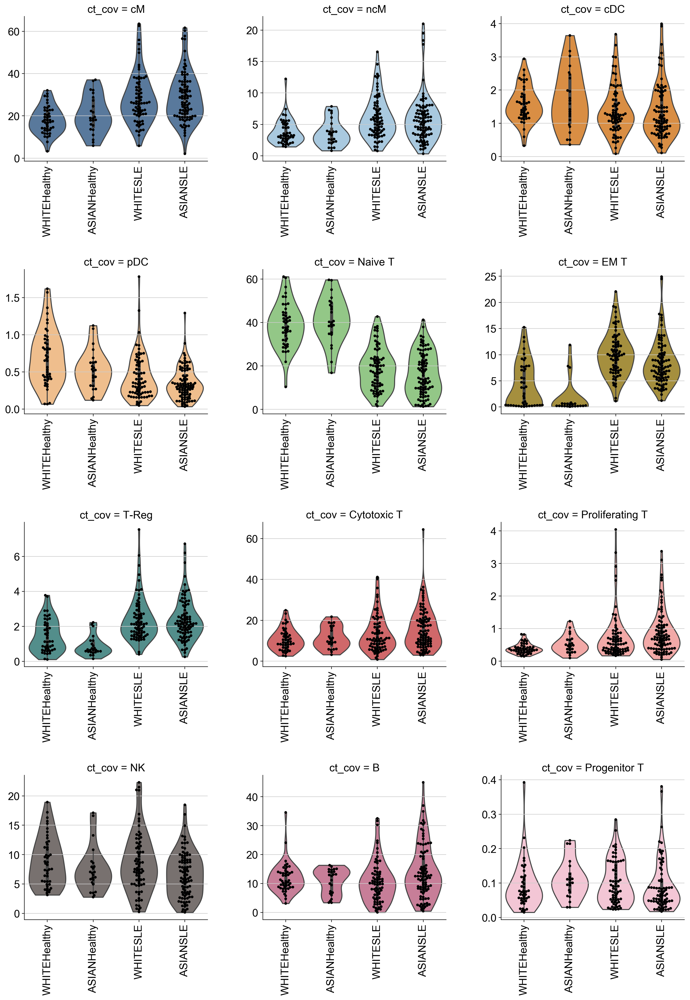

In [122]:
## Make proportion plots
adatatmp = adata[~adata.obs['pop_cov_SLE_status'].isin(['HISPANICSLE', 'BLACKSLE'])]
adatatmp = adatatmp[~adatatmp.obs['Cohort'].isin(['Broad'])]
adata_obs_small = adatatmp.obs
ind_count = adata_obs_small.groupby(['ind_cov_pop_cov','ct_cov','pop_cov_SLE_status','SLE_status', 'ind_cov'], observed=True)['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_pop_cov==ind_count_sums.ind_cov_pop_cov[ii]] = ind_count_sums.counts[ii]


ind_perc.ind_cov_pop_cov = ind_perc.ind_cov_pop_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_pop_cov = ind_count_sums.ind_cov_pop_cov.apply(lambda x: x.split('_')[0])
ind_perc.ind_cov_pop_cov = ind_perc.ind_cov_pop_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

perc_plot = sns.catplot(x='pop_cov_SLE_status', y='ct_perc', order=['WHITEHealthy', 'ASIANHealthy', 'WHITESLE', 'ASIANSLE'], hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, col='ct_cov', col_wrap=3, cut=0, dodge=False, aspect=1, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.swarmplot(x="pop_cov_SLE_status", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], order=['WHITEHealthy', 'ASIANHealthy', 'WHITESLE', 'ASIANSLE'], color="0", size=4, ax=perc_plot.axes[ct_i])
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.3, hspace = 0.75)
    
perc_plot.savefig(figdir+"/violin.ct_cov_proportions_race_EurAsian_L3CLUESFlare.pdf")

def get_proportion_stats(ind_perc, group1, group2, covar):
    print('{0} versus {1}'.format(group1, group2))
    all_out = pd.DataFrame();
    ind_perc0 = ind_perc[ind_perc[covar].isin(group1+group2)]
    Effect = {}
    for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
        ct = ind_perc0.ct_cov.cat.categories[ct_i]
        ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
        weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
        disease = ind_perc0[covar][ind_perc0.ct_cov==ct]
        disease = disease.astype("str")
        disease.values[disease.isin(group1)] = 0
        disease.values[disease.isin(group2)] = 1
        disease = sm.add_constant(disease)
        est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
        est=est.fit()
        effect=est.params[1]
        pval=est.pvalues[1]
        Effect[ct] = effect
        all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
        all_out['Pval'] = all_out['Pval'].astype(float)
    def highlight_max(p):
        sig = p < (0.01/len(p))
        return ['background-color: yellow' if v else '' for v in sig]
    all_out = all_out.style.apply(highlight_max, subset=['Pval'])   
    display(all_out)

get_proportion_stats(ind_perc, group1=['WHITEHealthy'], group2=['ASIANHealthy'], covar='pop_cov_SLE_status')
get_proportion_stats(ind_perc, group1=['WHITEHealthy'], group2=['WHITESLE'], covar='pop_cov_SLE_status')
get_proportion_stats(ind_perc, group1=['ASIANHealthy'], group2=['ASIANSLE'], covar='pop_cov_SLE_status')

# Proportion and statistics by race European and Asian only (CLUES, L3 only)

['WHITEHealthy'] versus ['ASIANHealthy']


,Beta,Cell,Pval
0,3.6751477696333046,cM,0.068994
1,-0.06883609650753897,ncM,0.898063
2,0.08625912893712137,cDC,0.618697
3,-0.14537597083714351,pDC,0.134925
4,1.8323784745596887,Naive T,0.522322
5,-3.5301911875965715,EM T,0.001642
6,-0.7210954373994201,T-Reg,0.003181
7,1.4964129437953668,Cytotoxic T,0.299595
8,0.04262350330999111,Proliferating T,0.446222
9,-2.1392979243640715,NK,0.060120


['WHITEHealthy'] versus ['WHITESLE']


,Beta,Cell,Pval
0,12.198860654583175,cM,0.000000
1,2.4921679124332554,ncM,0.000025
2,0.010427162081605185,cDC,0.938883
3,-0.2534773626631614,pDC,0.000166
4,-22.527666346982222,Naive T,0.000000
5,6.222254275329201,EM T,0.000000
6,0.9998142267938868,T-Reg,0.000034
7,3.2611981540038384,Cytotoxic T,0.034869
8,0.29566999184937004,Proliferating T,0.007390
9,-0.7859363533485273,NK,0.354235


['ASIANHealthy'] versus ['ASIANSLE']


,Beta,Cell,Pval
0,7.7482750218164345,cM,0.009874
1,1.9508346293397525,ncM,0.039324
2,-0.22242484710945423,cDC,0.316163
3,-0.2185991315492737,pDC,0.000094
4,-26.97638452760515,Naive T,0.000000
5,8.197047806050376,EM T,0.000000
6,1.6418893001249661,T-Reg,0.000000
7,4.712921068622101,Cytotoxic T,0.062919
8,0.3897430206214515,Proliferating T,0.018087
9,-0.08964243373190373,NK,0.932036


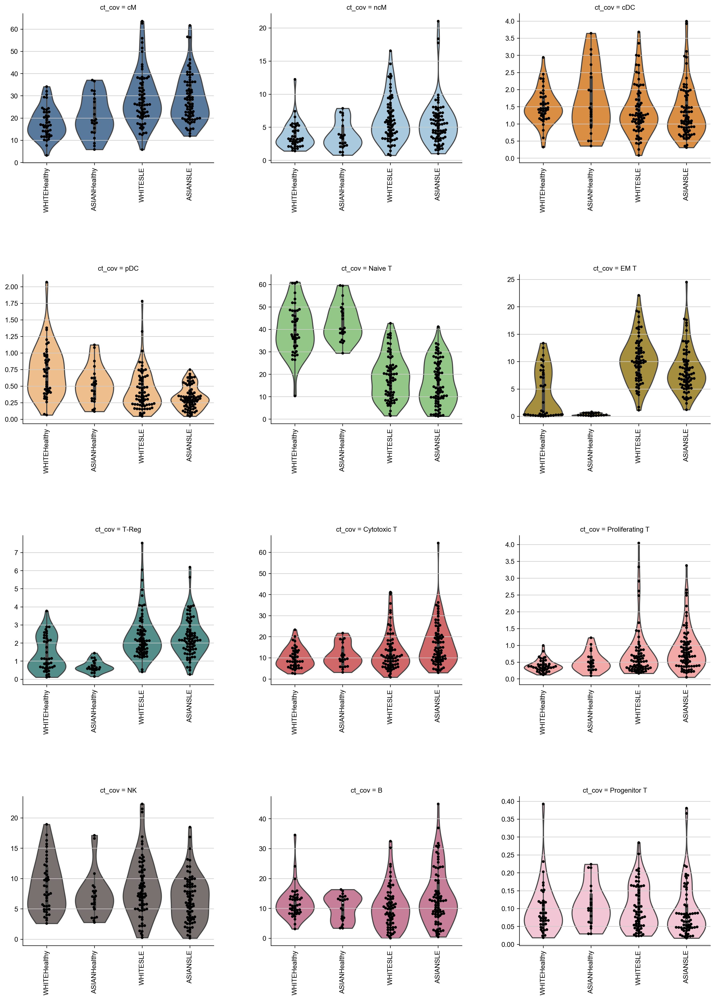

In [110]:
## Make proportion plots
adatatmp = adata[~adata.obs['pop_cov_SLE_status'].isin(['HISPANICSLE', 'BLACKSLE'])]
adatatmp = adatatmp[~adatatmp.obs['Cohort'].isin(['Broad', 'Flare'])]
adata_obs_small = adatatmp.obs
ind_count = adata_obs_small.groupby(['ind_cov_pop_cov','ct_cov','pop_cov_SLE_status','SLE_status', 'ind_cov'], observed=True)['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_pop_cov==ind_count_sums.ind_cov_pop_cov[ii]] = ind_count_sums.counts[ii]


ind_perc.ind_cov_pop_cov = ind_perc.ind_cov_pop_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_pop_cov = ind_count_sums.ind_cov_pop_cov.apply(lambda x: x.split('_')[0])
ind_perc.ind_cov_pop_cov = ind_perc.ind_cov_pop_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

perc_plot = sns.catplot(x='pop_cov_SLE_status', y='ct_perc', order=['WHITEHealthy', 'ASIANHealthy', 'WHITESLE', 'ASIANSLE'], hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, col='ct_cov', col_wrap=3, cut=0, dodge=False, aspect=1, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.swarmplot(x="pop_cov_SLE_status", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], order=['WHITEHealthy', 'ASIANHealthy', 'WHITESLE', 'ASIANSLE'], color="0", size=4, ax=perc_plot.axes[ct_i])
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.3, hspace = 0.75)
    
perc_plot.savefig(figdir+"/violin.ct_cov_proportions_race_EurAsian_L3CLUES.pdf")

def get_proportion_stats(ind_perc, group1, group2, covar):
    print('{0} versus {1}'.format(group1, group2))
    all_out = pd.DataFrame();
    ind_perc0 = ind_perc[ind_perc[covar].isin(group1+group2)]
    Effect = {}
    for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
        ct = ind_perc0.ct_cov.cat.categories[ct_i]
        ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
        weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
        disease = ind_perc0[covar][ind_perc0.ct_cov==ct]
        disease = disease.astype("str")
        disease.values[disease.isin(group1)] = 0
        disease.values[disease.isin(group2)] = 1
        disease = sm.add_constant(disease)
        est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
        est=est.fit()
        effect=est.params[1]
        pval=est.pvalues[1]
        Effect[ct] = effect
        all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
        all_out['Pval'] = all_out['Pval'].astype(float)
    def highlight_max(p):
        sig = p < (0.01/len(p))
        return ['background-color: yellow' if v else '' for v in sig]
    all_out = all_out.style.apply(highlight_max, subset=['Pval'])   
    display(all_out)

get_proportion_stats(ind_perc, group1=['WHITEHealthy'], group2=['ASIANHealthy'], covar='pop_cov_SLE_status')
get_proportion_stats(ind_perc, group1=['WHITEHealthy'], group2=['WHITESLE'], covar='pop_cov_SLE_status')
get_proportion_stats(ind_perc, group1=['ASIANHealthy'], group2=['ASIANSLE'], covar='pop_cov_SLE_status')

# Proportion and statistics by race and cohort (all)

['ASIANL3Healthy'] versus ['ASIANFlareHealthy']


,Beta,Cell,Pval
0,-2.496834854011711,cM,0.637715
1,-0.17444621704175867,ncM,0.882949
2,0.6096648374315374,cDC,0.233864
3,-0.07913822407503207,pDC,0.645896
4,-23.588798347755176,Naive T,0.000022
5,12.107814417174355,EM T,0.000000
6,1.9102791847605263,T-Reg,0.000000
7,5.378456838266425,Cytotoxic T,0.106030
8,0.1500790040334724,Proliferating T,0.305306
9,1.5367768779984106,NK,0.491030


['ASIANL3Healthy'] versus ['WHITEL3SLE']


,Beta,Cell,Pval
0,10.52532216882771,cM,0.002087
1,2.3671870249944305,ncM,0.002943
2,-0.08490632148247124,cDC,0.743287
3,-0.02422793997016065,pDC,0.828515
4,-23.832207251654907,Naive T,0.000000
5,10.986536463935359,EM T,0.000000
6,2.00838929095947,T-Reg,0.000001
7,-0.5604904394311938,Cytotoxic T,0.772473
8,0.35428905575232156,Proliferating T,0.033608
9,0.903230264172519,NK,0.448394


['ASIANL3SLE'] versus ['ASIANFlareSLE']


,Beta,Cell,Pval
0,2.6187079261145603,cM,0.573041
1,1.7939671331413476,ncM,0.270850
2,0.3305663376987007,cDC,0.299037
3,0.1480686839799794,pDC,0.102211
4,-4.260583327566793,Naive T,0.239316
5,-0.9917927120001444,EM T,0.477636
6,-0.2794469491853148,T-Reg,0.538514
7,-1.758760256567417,Cytotoxic T,0.505618
8,0.12792932604148324,Proliferating T,0.579709
9,0.21760422323920303,NK,0.873012


['ASIANL3SLE'] versus ['WHITEL3SLE']


,Beta,Cell,Pval
0,1.8527530927849356,cM,0.591803
1,0.30171319679629915,ncM,0.777782
2,0.2730206615454799,cDC,0.258929
3,0.19899197761834847,pDC,0.035084
4,-1.4807487796689853,Naive T,0.611173
5,2.313637930171283,EM T,0.042016
6,0.06108166277625912,T-Reg,0.873464
7,-2.6576226662506905,Cytotoxic T,0.218632
8,0.0009351925804502864,Proliferating T,0.995544
9,0.663880343773191,NK,0.550915


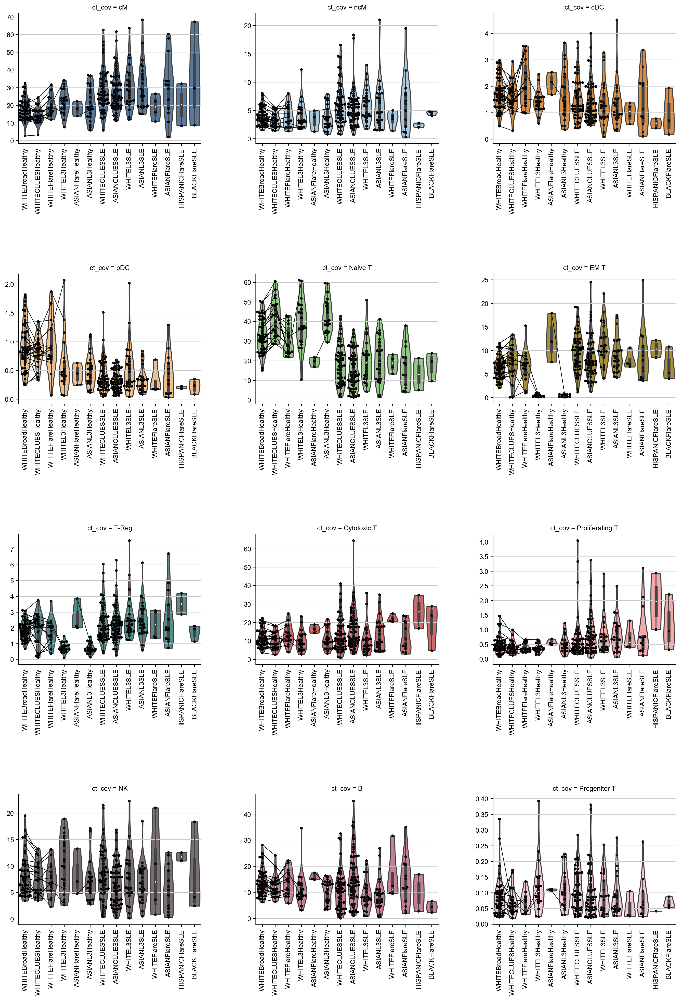

In [111]:
## Make proportion plots
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_pop_cov_cohort','ct_cov','pop_cov_cohort_SLE_status','SLE_status', 'ind_cov'], observed=True)['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_pop_cov_cohort==ind_count_sums.ind_cov_pop_cov_cohort[ii]] = ind_count_sums.counts[ii]


ind_perc.ind_cov_pop_cov_cohort = ind_perc.ind_cov_pop_cov_cohort.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_pop_cov_cohort = ind_count_sums.ind_cov_pop_cov_cohort.apply(lambda x: x.split('_')[0])
ind_perc.ind_cov_pop_cov_cohort = ind_perc.ind_cov_pop_cov_cohort.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

sc.settings.set_figure_params(dpi=100, dpi_save=300, format='pdf', frameon=False, transparent=True, fontsize=10)
perc_plot = sns.catplot(x='pop_cov_cohort_SLE_status', y='ct_perc', order=['WHITEBroadHealthy', 'WHITECLUESHealthy',
                                                                           'WHITEFlareHealthy', 'WHITEL3Healthy', 
                                                                           'ASIANFlareHealthy', 'ASIANL3Healthy', 
                                                                           'WHITECLUESSLE', 'ASIANCLUESSLE', 
                                                                           'WHITEL3SLE', 'ASIANL3SLE', 
                                                                           'WHITEFlareSLE', 'ASIANFlareSLE', 
                                                                           'HISPANICFlareSLE', 'BLACKFlareSLE'], 
                        hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, col='ct_cov', 
                        col_wrap=3, cut=0, dodge=False, aspect=1, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.swarmplot(x="pop_cov_cohort_SLE_status", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], 
                  order=['WHITEBroadHealthy', 'WHITECLUESHealthy', 'WHITEFlareHealthy', 'WHITEL3Healthy', 
                         'ASIANFlareHealthy', 'ASIANL3Healthy', 'WHITECLUESSLE', 'ASIANCLUESSLE', 'WHITEL3SLE', 
                         'ASIANL3SLE', 'WHITEFlareSLE', 'ASIANFlareSLE', 'HISPANICFlareSLE', 'BLACKFlareSLE'], 
                  color="0", size=4, ax=perc_plot.axes[ct_i])
    try:
        sns.pointplot(x="pop_cov_cohort_SLE_status", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct],
                      order=['WHITEBroadHealthy', 'WHITECLUESHealthy', 'WHITEFlareHealthy', 'WHITEL3Healthy', 
                             'ASIANFlareHealthy', 'ASIANL3Healthy', 'WHITECLUESSLE', 'ASIANCLUESSLE', 'WHITEL3SLE', 
                             'ASIANL3SLE', 'WHITEFlareSLE', 'ASIANFlareSLE', 'HISPANICFlareSLE', 'BLACKFlareSLE'], 
                      color="0", scale=0.3, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.3, hspace = 1)
    
perc_plot.savefig(figdir+"/violin.ct_cov_proportions_race_cohort.pdf")

def get_proportion_stats(ind_perc, group1, group2, covar):
    print('{0} versus {1}'.format(group1, group2))
    all_out = pd.DataFrame();
    ind_perc0 = ind_perc[ind_perc[covar].isin(group1+group2)]
    Effect = {}
    for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
        ct = ind_perc0.ct_cov.cat.categories[ct_i]
        ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
        weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
        disease = ind_perc0[covar][ind_perc0.ct_cov==ct]
        disease = disease.astype("str")
        disease.values[disease.isin(group1)] = 0
        disease.values[disease.isin(group2)] = 1
        disease = sm.add_constant(disease)
        est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
        est=est.fit()
        effect=est.params[1]
        pval=est.pvalues[1]
        Effect[ct] = effect
        all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
        all_out['Pval'] = all_out['Pval'].astype(float)
    def highlight_max(p):
        sig = p < (0.01/len(p))
        return ['background-color: yellow' if v else '' for v in sig]
    all_out = all_out.style.apply(highlight_max, subset=['Pval'])   
    display(all_out)

get_proportion_stats(ind_perc, group1=['ASIANL3Healthy'], group2=['ASIANFlareHealthy'], covar='pop_cov_cohort_SLE_status')
get_proportion_stats(ind_perc, group1=['ASIANL3Healthy'], group2=['WHITEL3SLE'], covar='pop_cov_cohort_SLE_status')
get_proportion_stats(ind_perc, group1=['ASIANL3SLE'], group2=['ASIANFlareSLE'], covar='pop_cov_cohort_SLE_status')
get_proportion_stats(ind_perc, group1=['ASIANL3SLE'], group2=['WHITEL3SLE'], covar='pop_cov_cohort_SLE_status')


# Proportion and statistics by race and cohort White and Asian only, CLUES and L3 only

['ASIANL3Healthy'] versus ['WHITEL3SLE']


,Beta,Cell,Pval
0,10.52532216882771,cM,0.002087
1,2.3671870249944305,ncM,0.002943
2,-0.08490632148247124,cDC,0.743287
3,-0.02422793997016065,pDC,0.828515
4,-23.832207251654907,Naive T,0.000000
5,10.986536463935359,EM T,0.000000
6,2.00838929095947,T-Reg,0.000001
7,-0.5604904394311938,Cytotoxic T,0.772473
8,0.35428905575232156,Proliferating T,0.033608
9,0.903230264172519,NK,0.448394


['ASIANL3SLE'] versus ['ASIANFlareSLE']


,Beta,Cell,Pval
0,0.0,cM,nan
1,0.0,ncM,nan
2,0.0,cDC,nan
3,0.0,pDC,nan
4,0.0,Naive T,nan
5,0.0,EM T,nan
6,0.0,T-Reg,nan
7,0.0,Cytotoxic T,nan
8,0.0,Proliferating T,nan
9,0.0,NK,nan


['ASIANL3SLE'] versus ['WHITEL3SLE']


,Beta,Cell,Pval
0,1.8527530927849356,cM,0.591803
1,0.30171319679629915,ncM,0.777782
2,0.2730206615454799,cDC,0.258929
3,0.19899197761834847,pDC,0.035084
4,-1.4807487796689853,Naive T,0.611173
5,2.313637930171283,EM T,0.042016
6,0.06108166277625912,T-Reg,0.873464
7,-2.6576226662506905,Cytotoxic T,0.218632
8,0.0009351925804502864,Proliferating T,0.995544
9,0.663880343773191,NK,0.550915


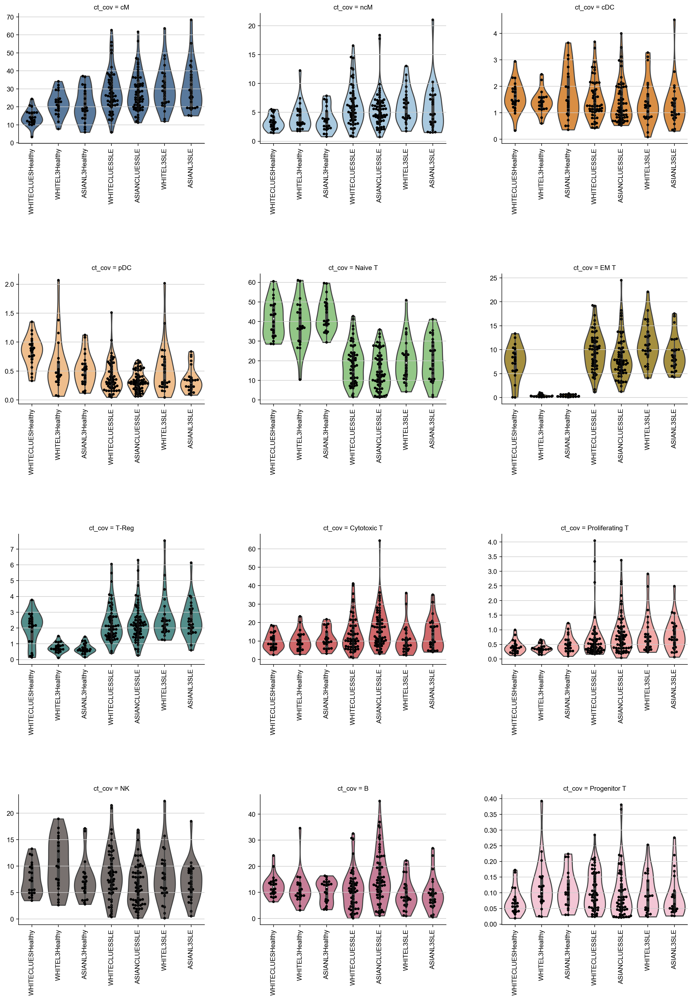

In [112]:
## Make proportion plots
adatatmp = adata[~adata.obs['pop_cov_SLE_status'].isin(['HISPANICSLE', 'BLACKSLE'])]
adatatmp = adatatmp[~adatatmp.obs['Cohort'].isin(['Broad', 'Flare'])]
adata_obs_small = adatatmp.obs
ind_count = adata_obs_small.groupby(['ind_cov_pop_cov_cohort','ct_cov','pop_cov_cohort_SLE_status','SLE_status', 'ind_cov'], observed=True)['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_pop_cov_cohort==ind_count_sums.ind_cov_pop_cov_cohort[ii]] = ind_count_sums.counts[ii]


ind_perc.ind_cov_pop_cov_cohort = ind_perc.ind_cov_pop_cov_cohort.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_pop_cov_cohort = ind_count_sums.ind_cov_pop_cov_cohort.apply(lambda x: x.split('_')[0])
ind_perc.ind_cov_pop_cov_cohort = ind_perc.ind_cov_pop_cov_cohort.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

sc.settings.set_figure_params(dpi=100, dpi_save=300, format='pdf', frameon=False, transparent=True, fontsize=10)
perc_plot = sns.catplot(x='pop_cov_cohort_SLE_status', y='ct_perc', order=['WHITECLUESHealthy','WHITEL3Healthy', 
                                                                           'ASIANL3Healthy','WHITECLUESSLE', 
                                                                           'ASIANCLUESSLE', 'WHITEL3SLE', 'ASIANL3SLE'], 
                        hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, col='ct_cov', 
                        col_wrap=3, cut=0, dodge=False, aspect=1, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.swarmplot(x="pop_cov_cohort_SLE_status", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], 
                  order=['WHITECLUESHealthy','WHITEL3Healthy', 'ASIANL3Healthy','WHITECLUESSLE', 
                         'ASIANCLUESSLE', 'WHITEL3SLE', 'ASIANL3SLE'], 
                  color="0", size=4, ax=perc_plot.axes[ct_i])
    try:
        sns.pointplot(x="pop_cov_cohort_SLE_status", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct],
                      order=['WHITECLUESHealthy','WHITEL3Healthy', 'ASIANL3Healthy','WHITECLUESSLE', 
                         'ASIANCLUESSLE', 'WHITEL3SLE', 'ASIANL3SLE'], 
                      color="0", scale=0.3, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.3, hspace = 1)
    
perc_plot.savefig(figdir+"/violin.ct_cov_proportions_race_cohort_EurAsian_CLUESL3.pdf")

def get_proportion_stats(ind_perc, group1, group2, covar):
    print('{0} versus {1}'.format(group1, group2))
    all_out = pd.DataFrame();
    ind_perc0 = ind_perc[ind_perc[covar].isin(group1+group2)]
    Effect = {}
    for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
        ct = ind_perc0.ct_cov.cat.categories[ct_i]
        ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
        weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
        disease = ind_perc0[covar][ind_perc0.ct_cov==ct]
        disease = disease.astype("str")
        disease.values[disease.isin(group1)] = 0
        disease.values[disease.isin(group2)] = 1
        disease = sm.add_constant(disease)
        est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
        est=est.fit()
        effect=est.params[1]
        pval=est.pvalues[1]
        Effect[ct] = effect
        all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
        all_out['Pval'] = all_out['Pval'].astype(float)
    def highlight_max(p):
        sig = p < (0.01/len(p))
        return ['background-color: yellow' if v else '' for v in sig]
    all_out = all_out.style.apply(highlight_max, subset=['Pval'])   
    display(all_out)


get_proportion_stats(ind_perc, group1=['ASIANL3Healthy'], group2=['WHITEL3SLE'], covar='pop_cov_cohort_SLE_status')
get_proportion_stats(ind_perc, group1=['ASIANL3SLE'], group2=['WHITEL3SLE'], covar='pop_cov_cohort_SLE_status')


# EHR WBC, Abs Lymphocyte count, Abs Monocyte count

In [306]:
adata.obs['ind_cov_batch_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['ind_cov']+ row['batch_cov'], axis=1), ordered=True)
adata.obs['ind_cov_Cohort'] = pd.Categorical(adata.obs.apply(lambda row: row['ind_cov']+ row['Cohort'], axis=1), ordered=True)

In [714]:
def do_concentrations(adata):
    conc = pd.read_excel('CLUES_LUPCON_ASB_COUNTS.xlsx')
    cohort_subjects = adata.obs['ind_cov'].unique().tolist()
    sample_concentrations = {}
    for ii in range(len(cohort_subjects)):
        if cohort_subjects[ii][:2]=='HC':
            if np.sum(conc['ptid'].isin([cohort_subjects[ii]])) > 0:
                sample_concentrations[cohort_subjects[ii]] = conc[conc['ptid'].isin([cohort_subjects[ii]])]['cell_collected (10^6)'].values[0]
        else:
            if np.sum(conc['ptid'].isin([cohort_subjects[ii].split('_')[0]])) > 0:
                sample_concentrations[cohort_subjects[ii]] = conc[conc['ptid'].isin([cohort_subjects[ii].split('_')[0]])]['cell_collected (10^6)'].values[0]
            else:
                sample_concentrations[cohort_subjects[ii]] = 'error'
    sample_concentrations = pd.DataFrame(sample_concentrations, index=['ASB_Total_PBMCs'])
    sample_concentrations = sample_concentrations.transpose()[~sample_concentrations.transpose().isin(['error'])].dropna().transpose()

    adata = adata[adata.obs['ind_cov'].isin(sample_concentrations.columns.tolist())]
    adata.obs['ASB_Total_PBMCs'] = list(np.repeat(-1, len(adata)))
    sample_inds = sample_concentrations.columns.tolist()
    for ii in range(len(sample_inds)):
        adata.obs['ASB_Total_PBMCs'][adata.obs['ind_cov'] == sample_inds[ii]] = sample_concentrations[sample_inds[ii]][0]
    print('Number of cells incorrectly labeled: {}'.format(np.sum(adata.obs['ASB_Total_PBMCs'] ==-1)))

    # Make proportion plots
    adatatmp = adata[~adata.obs['pop_cov_SLE_status'].isin(['HISPANICSLE', 'BLACKSLE'])]
    adata_obs_small = adatatmp.obs
    ind_count = adata_obs_small.groupby(['ind_cov_Cohort','ct_cov', 'pop_cov_SLE_status','Cohort','pop_cov','SLE_status', 'ind_cov', 'ASB_Total_PBMCs'], observed=True)['ct_cov'].count()
    # Add weights to WLS
    counts = ind_count.values.tolist()
    ind_count_sums = ind_count.groupby(level=[0]).sum()
    ind_count_sums = ind_count_sums.reset_index(name="counts")
    ind_count = ind_count.reset_index(name="n_cells")
    ind_count = pd.DataFrame(ind_count)
    # Add weights to WLS
    ind_count['counts'] = counts

    ind_count['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
    # Add total sums per individual to structure
    for ii in range(len(ind_count_sums)):
        ind_count['ind_count_sum'][ind_count.ind_cov_Cohort==ind_count_sums.ind_cov_Cohort[ii]] = ind_count_sums.counts[ii]

    ind_count.ind_cov_Cohort = ind_count.ind_cov_Cohort.apply(lambda x: x.split('_')[0])
    ind_count_sums.ind_cov_Cohort = ind_count_sums.ind_cov_Cohort.apply(lambda x: x.split('_')[0])
    ind_count.ind_cov_Cohort = ind_count.ind_cov_Cohort.astype("str")
    ind_count.reset_index(inplace=True)
    ind_count.ct_cov = ind_count.ct_cov.astype('category')
    ind_count.ct_cov = ind_count.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)
    return ind_count
Cell_concentration = do_concentrations(adata)


Trying to set attribute `.obs` of view, copying.


Number of cells incorrectly labeled: 0


In [715]:
def add_cellcount(adata, covar):
    labs = pd.read_excel('Lab_Data.V1_updated.xlsx')
    cohort_subjects = adata.obs['ind_cov'].unique().tolist()
    sample_concentrations = {}
    for ii in range(len(cohort_subjects)):
        if np.sum(labs['genotypeid'].isin([cohort_subjects[ii]])) > 0:
            sample_concentrations[cohort_subjects[ii]] = labs[labs['genotypeid'].isin([cohort_subjects[ii]])][covar].values[0]
        else:
            sample_concentrations[cohort_subjects[ii]] = 'error'
    sample_concentrations = pd.DataFrame(sample_concentrations, index=[covar])
    sample_concentrations = sample_concentrations.transpose()[~sample_concentrations.transpose().isin(['error'])].dropna().transpose()
    return sample_concentrations

def quick_OLS(var1, var2, dataframe, show_summary=False, save=False, savetitle=""):
    sc.settings.set_figure_params(dpi=100, dpi_save=200, format='png', frameon=False, transparent=True, fontsize=12)
    dataframe[var1]
    Var1 = sm.add_constant(var1.values.tolist())
    results = sm.OLS(var2.values.tolist(), Var1).fit()
    if show_summary == True:
        print(results.summary())
        plt.figure()
        sns.scatterplot(var1, var2, hue='Cohort')
        sns.lineplot(var1, results.predict())
        plt.xlabel(var1.name)
        plt.ylabel(var2.name)
        plt.title('R^2: {}'.format(results.rsquared_adj))
        if save == True:
            plt.savefig("{}.pdf".format(savetitle), bbox_inches='tight')
    return results

WBC = add_cellcount(adata, covar='WhiteBloodCell')
AbsNeutro = add_cellcount(adata, covar='AbsNeutro')/1000
AbsEosino = add_cellcount(adata, covar='AbsEosino')/1000
AbsBaso = add_cellcount(adata, covar='AbsBaso')/1000
AbsLymph = add_cellcount(adata, covar='AbsLympho')/1000
AbsMono = add_cellcount(adata, covar='AbsMono')/1000
Labs = pd.concat([WBC, AbsLymph, AbsMono, AbsBaso, AbsEosino, AbsNeutro])
Labs = Labs.transpose()
Labs['PBMCs'] = Labs['WhiteBloodCell'] - Labs['AbsBaso'] - Labs['AbsEosino'] - Labs['AbsNeutro']
Labs['Proportion_Lympho'] = Labs['AbsLympho']/Labs['PBMCs']
Labs['Proportion_Mono'] = Labs['AbsMono']/Labs['PBMCs']
# Poor data collection
Labs = Labs.loc[~Labs.transpose().columns.isin(['1569_1569'])]
Labs = Labs[Labs['AbsLympho'] > 0.1]
Labs = Labs[Labs['AbsMono'] > 0.1]
Cell_concentration['ASB_Total_PBMCs'] = Cell_concentration['ASB_Total_PBMCs']/10
Cell_concentration_total = Cell_concentration.copy()
Cell_concentration = Cell_concentration[Cell_concentration['ind_cov'].isin(list(Labs.index))]

### Collected PBMCs vs EHR PBMCs

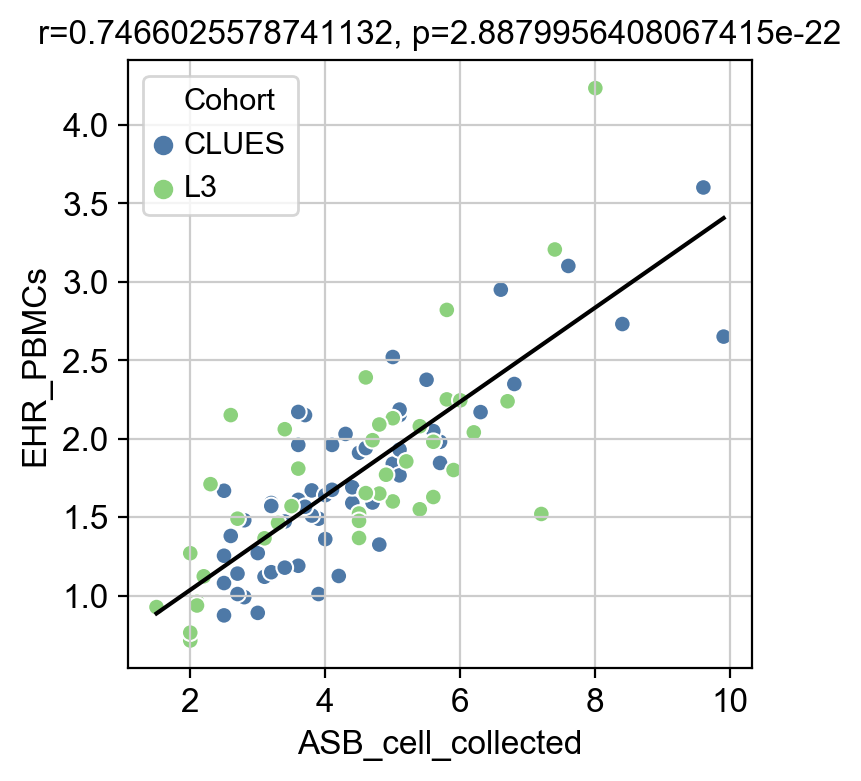

In [716]:
Cohorts = Cell_concentration['Cohort'].unique().tolist()
for C in Cohorts:
    tmp = Cell_concentration[Cell_concentration['Cohort']==C]
    people = Labs.transpose().columns[Labs.transpose().columns.isin(tmp['ind_cov'].unique().tolist())].tolist()
    EHRCohort = pd.DataFrame(index=people, columns=['EHR_PBMCs', 'ASB_cell_collected', 'Cohort']).transpose()
    EHRCohort.transpose()['Cohort'] = np.repeat(C, len(people))
    for p in people:
        EHRCohort[p]['EHR_PBMCs'] = Labs['PBMCs'][p]
        EHRCohort[p]['ASB_cell_collected'] = tmp['ASB_Total_PBMCs'][tmp['ind_cov']==p].values[0]
    EHRCohort = EHRCohort.transpose()
    EHRCohort['Cohort'] = np.repeat(C, len(people))
    if C == Cohorts[0]:
        EHRCohort_Total = EHRCohort
    else:
        try:
            EHRCohort_Total = pd.concat([EHRCohort_Total, EHRCohort])
        except:
            continue
    
sc.settings.set_figure_params(dpi=100, dpi_save=200, format='pdf', frameon=False, transparent=True, fontsize=12)
var1=EHRCohort_Total['ASB_cell_collected'].values.tolist()
var2=EHRCohort_Total['EHR_PBMCs'].values.tolist()
Var1 = sm.add_constant(var1)
results = sm.OLS(var2, Var1).fit()
ax = sns.scatterplot(x='ASB_cell_collected', y='EHR_PBMCs', data=EHRCohort_Total, hue='Cohort', palette=[colorrs[0], colorrs[4]])
sns.lineplot(var1, results.predict(), c='k')
plt.xlabel('ASB_cell_collected')
plt.ylabel('EHR_PBMCs')
r,p = stats.spearmanr(var1,var2)
plt.title('r={0}, p={1}'.format(r,p))
plt.savefig("{}.pdf".format(figdir+'/PBMCs collected vs EHR_PBMCs'), bbox_inches='tight')

### EHR Lymphocytes vs Cohort Lymphocyte abundance

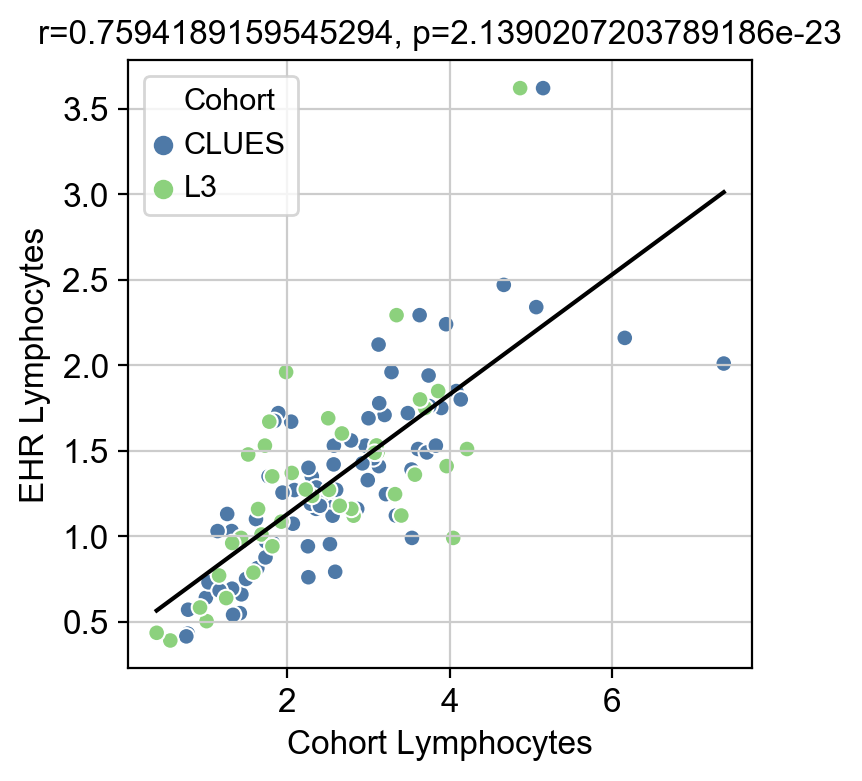

In [717]:
Cohorts = Cell_concentration['Cohort'].unique().tolist()
for C in Cohorts:
    tmp = Cell_concentration[Cell_concentration['Cohort']==C]
    people = Labs.transpose().columns[Labs.transpose().columns.isin(tmp['ind_cov'].unique().tolist())].tolist()
    EHRCohort = pd.DataFrame(index=people, columns=['EHR_Lymphocytes', 'Cohort_Lymphocytes', 'Cohort']).transpose()
    EHRCohort.transpose()['Cohort'] = np.repeat(C, len(people))
    for p in people:
        EHRCohort[p]['EHR_Lymphocytes'] = Labs['AbsLympho'][p]
        tmpi = tmp[tmp['ind_cov']==p]
        EHRCohort[p]['Cohort_Lymphocytes'] = tmpi['ASB_Total_PBMCs'].values[0]*(np.sum(tmpi[tmpi['ct_cov'].isin(['B', 'Naive T', 'EM T', 'Cytotoxic T', 'T-Reg', 'Proliferating T', 'Progenitor T'])]['counts'].values)/tmpi['ind_count_sum'].values[0])
    EHRCohort = EHRCohort.transpose()
    EHRCohort['Cohort'] = np.repeat(C, len(people))
    if C == Cohorts[0]:
        EHRCohort_Total = EHRCohort
    else:
        try:
            EHRCohort_Total = pd.concat([EHRCohort_Total, EHRCohort])
        except:
            continue
EHRCohort_Total_Lympho = EHRCohort_Total
sc.settings.set_figure_params(dpi=100, dpi_save=200, format='pdf', frameon=False, transparent=True, fontsize=12)
var1=EHRCohort_Total['Cohort_Lymphocytes'].values.tolist()
var2=EHRCohort_Total['EHR_Lymphocytes'].values.tolist()
Var1 = sm.add_constant(var1)
results = sm.OLS(var2, Var1).fit()
ax = sns.scatterplot(x='Cohort_Lymphocytes', y='EHR_Lymphocytes', data=EHRCohort_Total, hue='Cohort', palette=[colorrs[0], colorrs[4]])
sns.lineplot(var1, results.predict(), c='k')
plt.xlabel('Cohort Lymphocytes')
plt.ylabel('EHR Lymphocytes')
r,p = stats.spearmanr(var1,var2)
plt.title('r={0}, p={1}'.format(r,p))
plt.savefig("{}.pdf".format(figdir+'/EHR lymphocyte vs Cohort lymphocyte abundance'), bbox_inches='tight')

### EHR monocyte vs Cohort monocyte abundance

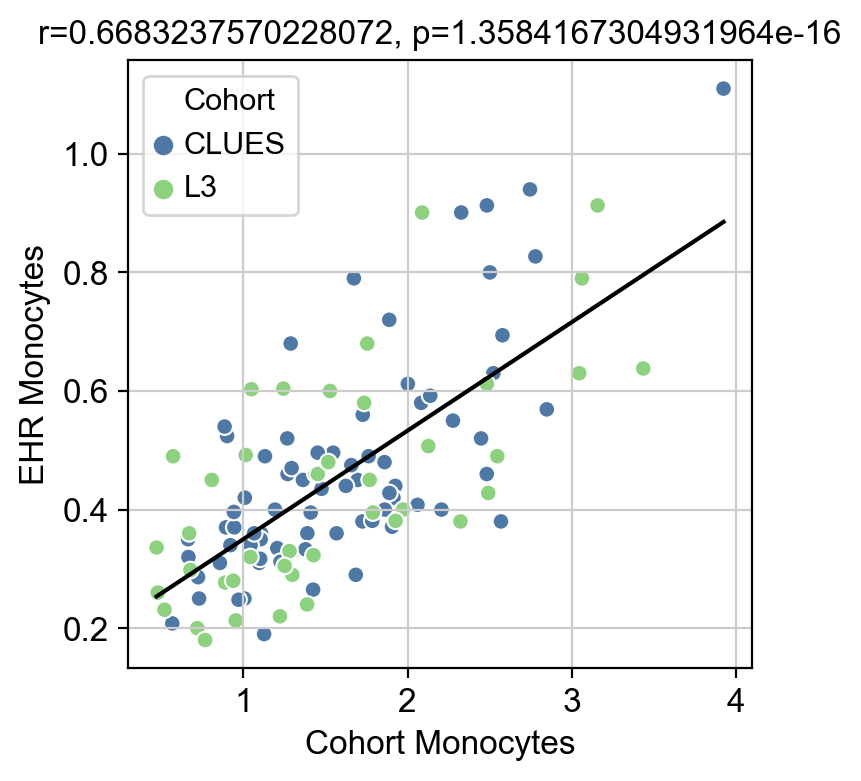

In [718]:
Cohorts = Cell_concentration['Cohort'].unique().tolist()
for C in Cohorts:
    tmp = Cell_concentration[Cell_concentration['Cohort']==C]
    people = Labs.transpose().columns[Labs.transpose().columns.isin(tmp['ind_cov'].unique().tolist())].tolist()
    EHRCohort = pd.DataFrame(index=people, columns=['EHR_Monocytes', 'Cohort_Monocytes', 'Cohort']).transpose()
    EHRCohort.transpose()['Cohort'] = np.repeat(C, len(people))
    for p in people:
        EHRCohort[p]['EHR_Monocytes'] = Labs['AbsMono'][p]
        tmpi = tmp[tmp['ind_cov']==p]
        EHRCohort[p]['Cohort_Monocytes'] = tmpi['ASB_Total_PBMCs'].values[0]*(np.sum(tmpi[tmpi['ct_cov'].isin(['cM', 'ncM'])]['counts'].values)/tmpi['ind_count_sum'].values[0])
    EHRCohort = EHRCohort.transpose()
    EHRCohort['Cohort'] = np.repeat(C, len(people))
    if C == Cohorts[0]:
        EHRCohort_Total = EHRCohort
    else:
        try:
            EHRCohort_Total = pd.concat([EHRCohort_Total, EHRCohort])
        except:
            continue
EHRCohort_Total_Mono = EHRCohort_Total
sc.settings.set_figure_params(dpi=100, dpi_save=200, format='pdf', frameon=False, transparent=True, fontsize=12)
var1=EHRCohort_Total['Cohort_Monocytes'].values.tolist()
var2=EHRCohort_Total['EHR_Monocytes'].values.tolist()
Var1 = sm.add_constant(var1)
results = sm.OLS(var2, Var1).fit()
ax = sns.scatterplot(x='Cohort_Monocytes', y='EHR_Monocytes', data=EHRCohort_Total, hue='Cohort', palette=[colorrs[0], colorrs[4]])
sns.lineplot(var1, results.predict(), c='k')
plt.xlabel('Cohort Monocytes')
plt.ylabel('EHR Monocytes')
r,p = stats.spearmanr(var1,var2)
plt.title('r={0}, p={1}'.format(r,p))
plt.savefig("{}.pdf".format(figdir+'/EHR monocytes vs Cohort monocyte abundance'), bbox_inches='tight')

### Combine monocytes and lymphocytes

In [719]:
EHRCohort_Total_Lympho['Cell_type'] = np.repeat('Lymphocyte', len(EHRCohort_Total_Lympho))
EHRCohort_Total_Mono['Cell_type'] = np.repeat('Monocyte', len(EHRCohort_Total_Mono))
EHRCohort_Total_Lympho = EHRCohort_Total_Lympho.rename(columns={'EHR_Lymphocytes':'EHR_values', 'Cohort_Lymphocytes':'Cohort_values'})
EHRCohort_Total_Mono = EHRCohort_Total_Mono.rename(columns={'EHR_Monocytes':'EHR_values', 'Cohort_Monocytes':'Cohort_values'})
EHRCohort = pd.concat([EHRCohort_Total_Lympho, EHRCohort_Total_Mono])



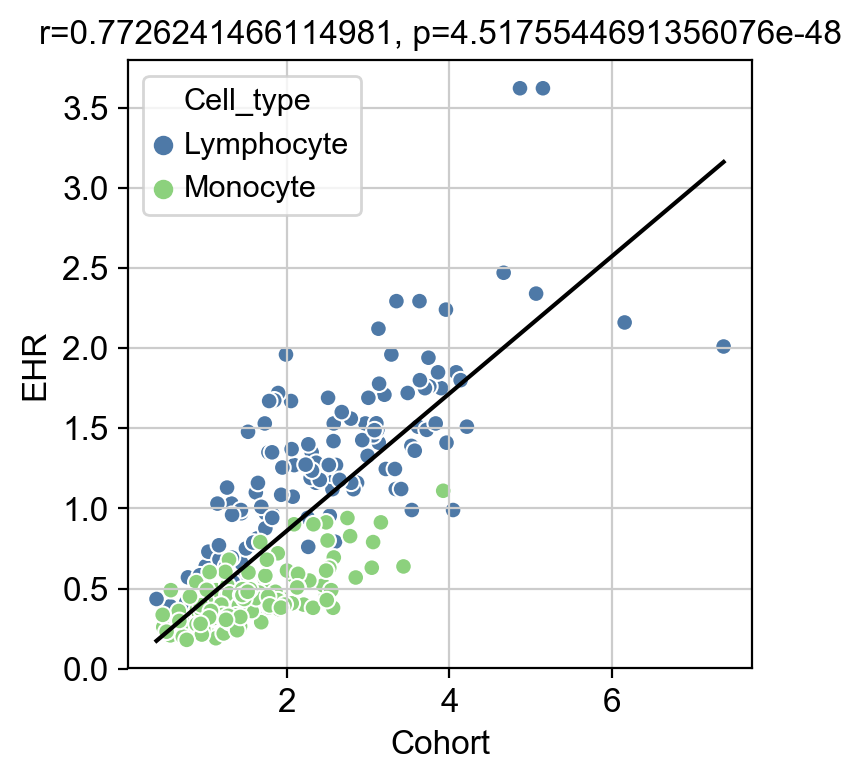

In [720]:
sc.settings.set_figure_params(dpi=100, dpi_save=200, format='pdf', frameon=False, transparent=True, fontsize=12)
var1=EHRCohort['Cohort_values'].values.tolist()
var2=EHRCohort['EHR_values'].values.tolist()
Var1 = sm.add_constant(var1)
results = sm.OLS(var2, Var1).fit()
ax = sns.scatterplot(x='Cohort_values', y='EHR_values', data=EHRCohort, hue='Cell_type', palette=[colorrs[0], colorrs[4]])
sns.lineplot(var1, results.predict(), c='k')
plt.xlabel('Cohort')
plt.ylabel('EHR')
r,p = stats.spearmanr(var1,var2)
plt.title('r={0}, p={1}'.format(r,p))
plt.savefig("{}.pdf".format(figdir+'/EHR vs Cohort abundance'), bbox_inches='tight')

# Violin plots

In [721]:
Cohorts = Cell_concentration_total['Cohort'].unique().tolist()
for C in Cohorts:
    tmp = Cell_concentration_total[Cell_concentration_total['Cohort']==C]
    people = tmp['ind_cov'].unique().tolist()
    EHRCohort = pd.DataFrame(index=people, columns=['Monocytes', 'Lymphocytes', 'pop_cov_SLE_status', 'ind_cov', 'Cohort']).transpose()
    EHRCohort.transpose()['Cohort'] = np.repeat(C, len(people))
    for p in people:
        tmpi = tmp[tmp['ind_cov']==p]
        EHRCohort[p]['Monocytes'] = tmpi['ASB_Total_PBMCs'].values[0]*(np.sum(tmpi[tmpi['ct_cov'].isin(['cM', 'ncM'])]['counts'].values)/tmpi['ind_count_sum'].values[0])
        EHRCohort[p]['Lymphocytes'] = tmpi['ASB_Total_PBMCs'].values[0]*(np.sum(tmpi[tmpi['ct_cov'].isin(['B', 'Naive T', 'EM T', 'Cytotoxic T', 'T-Reg', 'Proliferating T', 'Progenitor T'])]['counts'].values)/tmpi['ind_count_sum'].values[0])    
        EHRCohort[p]['pop_cov_SLE_status'] = tmpi['pop_cov_SLE_status'].values[0]
        EHRCohort[p]['ind_cov'] = tmpi['ind_cov'].values[0]
        
    EHRCohort = EHRCohort.transpose()
    EHRCohort['Cohort'] = np.repeat(C, len(people))
    if C == Cohorts[0]:
        EHRCohort_Total = EHRCohort
    else:
        try:
            EHRCohort_Total = pd.concat([EHRCohort_Total, EHRCohort])
        except:
            continue
EHRCohort_Total['Monocytes'] = EHRCohort_Total['Monocytes'].astype('float')
EHRCohort_Total['Lymphocytes'] = EHRCohort_Total['Lymphocytes'].astype('float')


### Lymphocytes

['WHITEHealthy'] vs ['WHITESLE']


,Beta,Cell,Pval
0,-3.2442528893426053,Lymphocytes,0.000000


['ASIANHealthy'] vs ['ASIANSLE']


,Beta,Cell,Pval
0,-4.85959313211724,Lymphocytes,0.000000


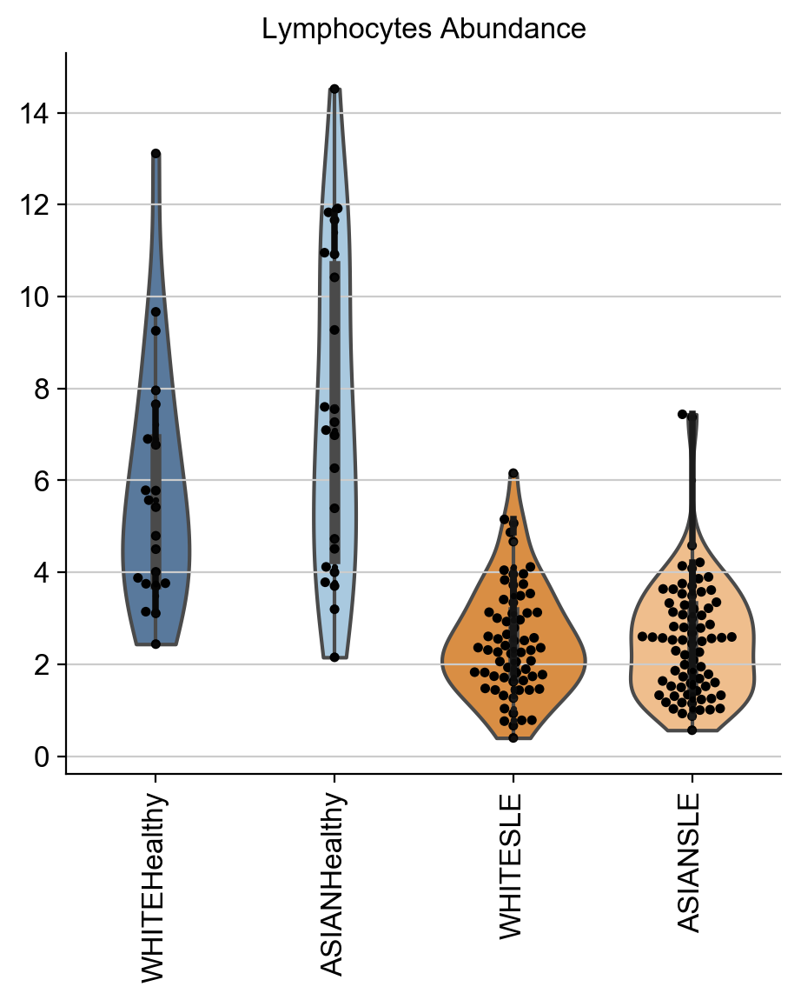

In [722]:
sc.settings.set_figure_params(dpi=100, dpi_save=200, format='pdf', frameon=False, transparent=True, fontsize=12)
perc_plot = sns.catplot(x='pop_cov_SLE_status', y='Lymphocytes',order=["WHITEHealthy", "ASIANHealthy", "WHITESLE", "ASIANSLE"], data=EHRCohort_Total, kind='violin', cut=0, dodge=False, aspect=1, sharex=False, sharey=False, palette=colorrs)
sns.swarmplot(x="pop_cov_SLE_status", y="Lymphocytes", data=EHRCohort_Total, order=['WHITEHealthy', 'ASIANHealthy', 'WHITESLE', 'ASIANSLE'], color="0", size=4)
sns.pointplot(x="pop_cov_SLE_status", y="Lymphocytes", hue="ind_cov", data=EHRCohort_Total, order=['WHITEHealthy', 'ASIANHealthy', 'WHITESLE', 'ASIANSLE'], color="0", scale=0.3)
perc_plot.ax.get_yaxis().label.set_visible(False)
perc_plot.ax.get_xaxis().label.set_visible(False)
perc_plot.ax.get_legend().remove()
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.3, hspace = 1)
plt.title('Lymphocytes Abundance')
plt.savefig("{}.pdf".format(figdir+'/Lymphocyte abundance'), bbox_inches='tight')

def get_proportions(dataframe, group1, group2):
    print('{0} vs {1}'.format(group1, group2))
    all_out = pd.DataFrame();
    Effect = {}
    EHRCohort_Totaltmp = EHRCohort_Total[EHRCohort_Total['pop_cov_SLE_status'].isin(group1+group2)]
    ct_perc = EHRCohort_Totaltmp['Lymphocytes']
    disease = EHRCohort_Totaltmp['pop_cov_SLE_status']
    disease = disease.astype("str")
    disease.values[disease.isin(group1)] = 0
    disease.values[disease.isin(group2)] = 1
    disease = sm.add_constant(disease)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    Effect = effect
    all_out = all_out.append(({"Cell":'Lymphocytes',"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    def highlight_max(p):
        sig = p < (0.01/len(p))
        return ['background-color: yellow' if v else '' for v in sig]
    all_out = all_out.style.apply(highlight_max, subset=['Pval'])   
    display(all_out)

get_proportions(EHRCohort_Total, group1=['WHITEHealthy'], group2=['WHITESLE'])
get_proportions(EHRCohort_Total, group1=['ASIANHealthy'], group2=['ASIANSLE'])

### Monocytes

['WHITEHealthy'] vs ['WHITESLE']


,Beta,Cell,Pval
0,-0.6707514922147845,Monocytes,0.000971


['ASIANHealthy'] vs ['ASIANSLE']


,Beta,Cell,Pval
0,-0.9103958765650293,Monocytes,0.000578


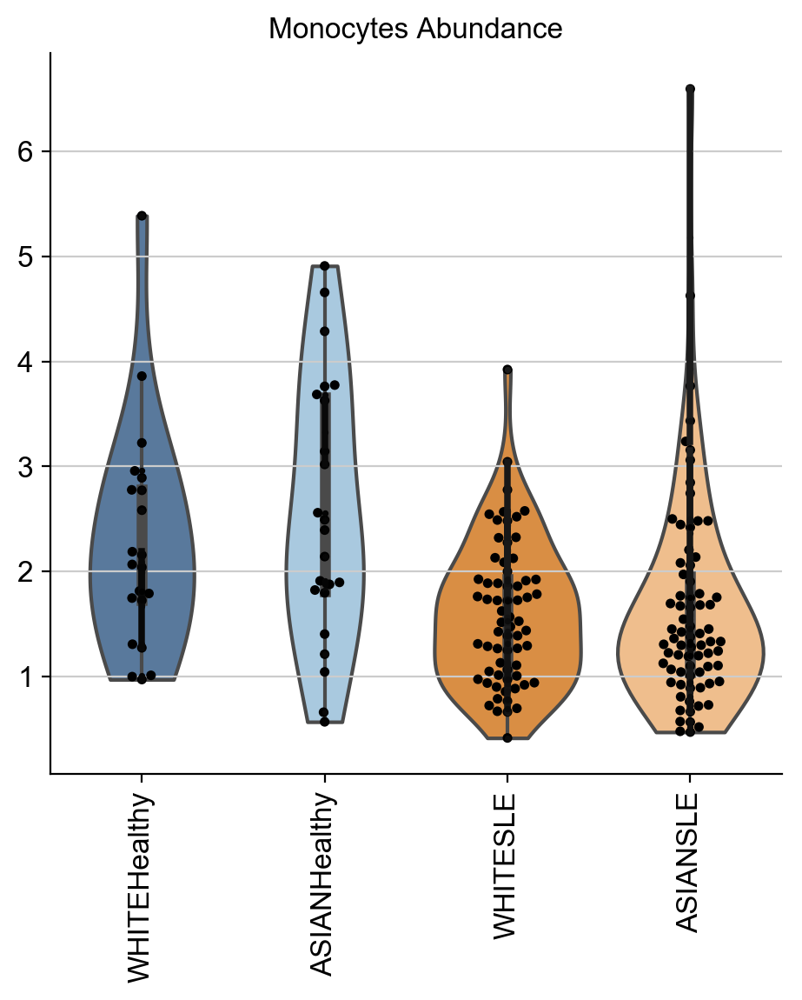

In [723]:
sc.settings.set_figure_params(dpi=100, dpi_save=200, format='pdf', frameon=False, transparent=True, fontsize=12)
perc_plot = sns.catplot(x='pop_cov_SLE_status', y='Monocytes',order=["WHITEHealthy", "ASIANHealthy", "WHITESLE", "ASIANSLE"], data=EHRCohort_Total, kind='violin', cut=0, dodge=False, aspect=1, sharex=False, sharey=False, palette=colorrs)
sns.swarmplot(x="pop_cov_SLE_status", y="Monocytes", data=EHRCohort_Total, order=['WHITEHealthy', 'ASIANHealthy', 'WHITESLE', 'ASIANSLE'], color="0", size=4)
sns.pointplot(x="pop_cov_SLE_status", y="Monocytes", hue="ind_cov", data=EHRCohort_Total, order=['WHITEHealthy', 'ASIANHealthy', 'WHITESLE', 'ASIANSLE'], color="0", scale=0.3)
perc_plot.ax.get_yaxis().label.set_visible(False)
perc_plot.ax.get_xaxis().label.set_visible(False)
perc_plot.ax.get_legend().remove()
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.3, hspace = 1)
plt.title('Monocytes Abundance')
plt.savefig("{}.pdf".format(figdir+'/Monocyte abundance'), bbox_inches='tight')

def get_proportions(dataframe, group1, group2):
    print('{0} vs {1}'.format(group1, group2))
    all_out = pd.DataFrame();
    Effect = {}
    EHRCohort_Totaltmp = EHRCohort_Total[EHRCohort_Total['pop_cov_SLE_status'].isin(group1+group2)]
    ct_perc = EHRCohort_Totaltmp['Monocytes']
    disease = EHRCohort_Totaltmp['pop_cov_SLE_status']
    disease = disease.astype("str")
    disease.values[disease.isin(group1)] = 0
    disease.values[disease.isin(group2)] = 1
    disease = sm.add_constant(disease)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    Effect = effect
    all_out = all_out.append(({"Cell":'Monocytes',"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
    def highlight_max(p):
        sig = p < (0.01/len(p))
        return ['background-color: yellow' if v else '' for v in sig]
    all_out = all_out.style.apply(highlight_max, subset=['Pval'])   
    display(all_out)

get_proportions(EHRCohort_Total, group1=['WHITEHealthy'], group2=['WHITESLE'])
get_proportions(EHRCohort_Total, group1=['ASIANHealthy'], group2=['ASIANSLE'])